### тут углы тригоном окр

C:\Users\Lenovo\anaconda3\envs\navigation\lib\site-packages\tqdm\auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


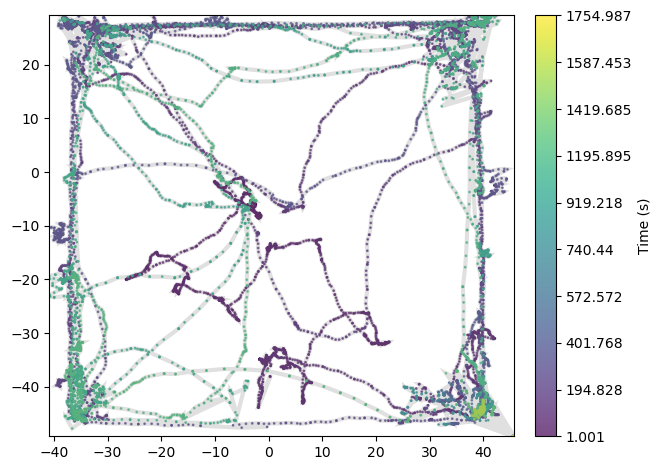

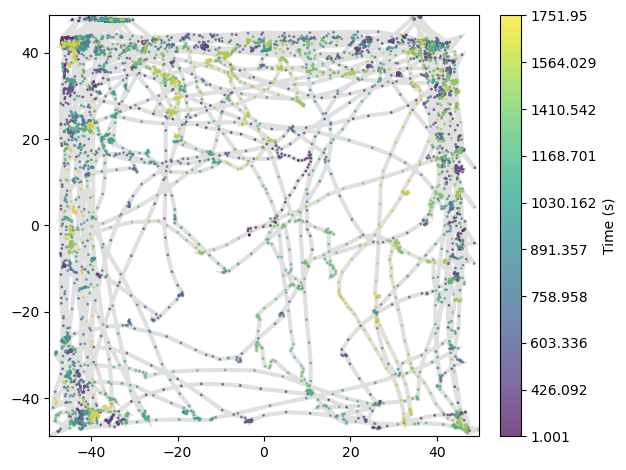

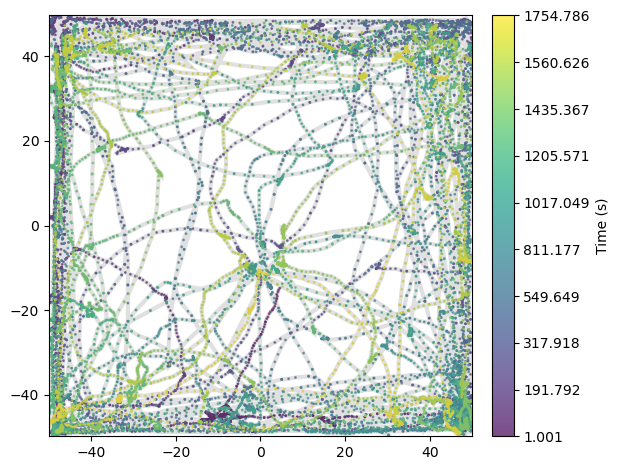

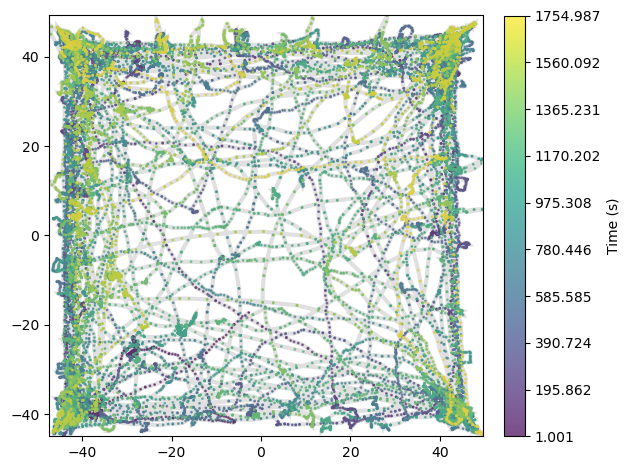

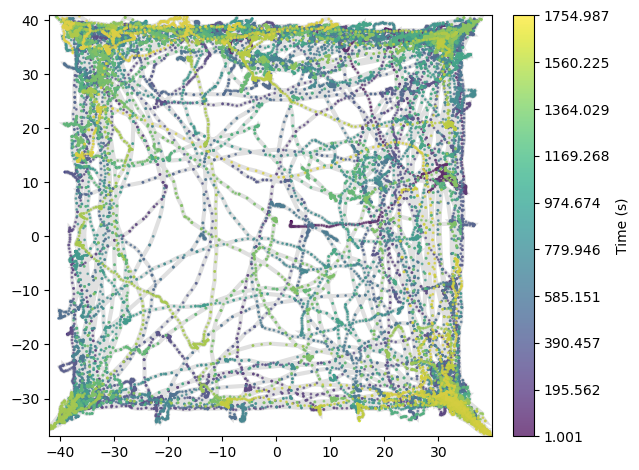

...

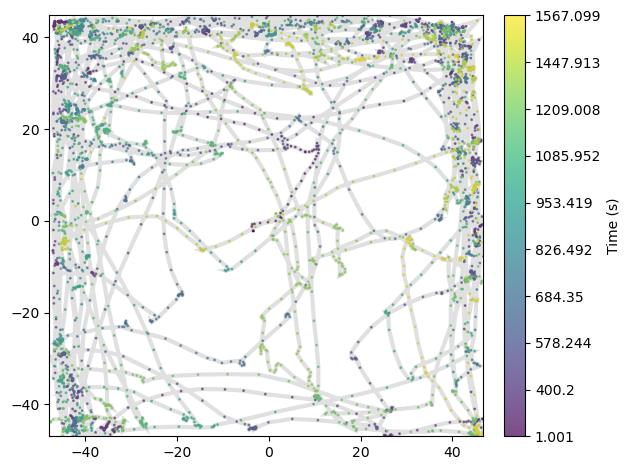

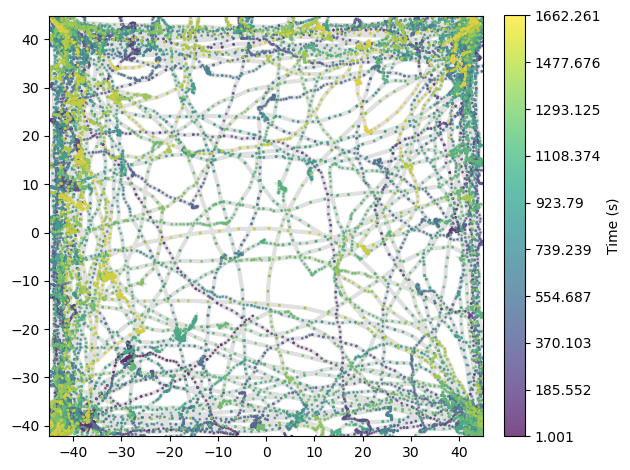

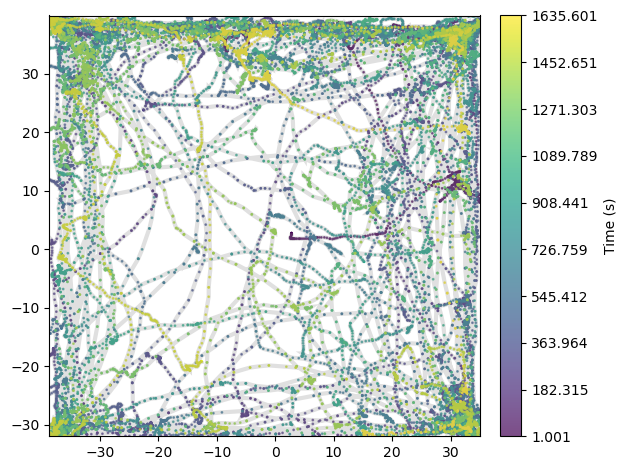

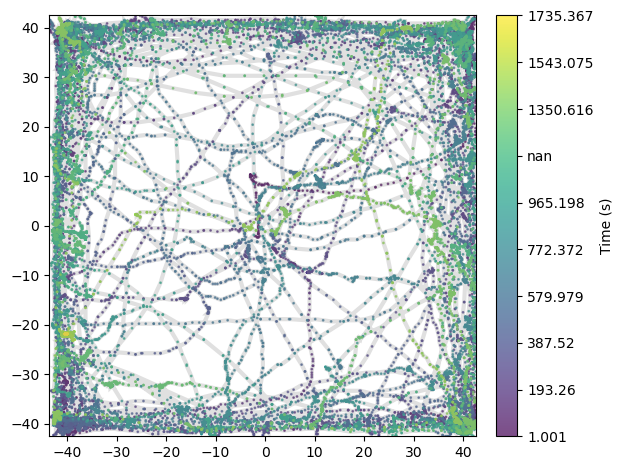

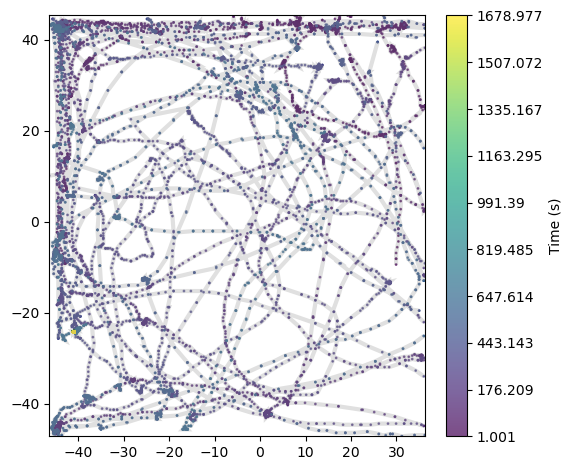

In [1]:
import traja
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter
from scipy import stats
from scipy.ndimage import gaussian_filter1d

import cv2

import math

import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
import pandas as pd

def openFile(ff):
    df = pd.read_csv(ff, sep=" ",header = None, names=['numb', 'time', 'x', 'y'])
    df = df.drop('numb', axis=1)
    df = df.drop(df[df.time > 1755].index)
    df = df[(np.abs(stats.zscore(df)) < 3).all(axis=1)]
    df.traja.plot()
    return(df)

def cutjump(df, xmax, xmin, ymax, ymin):
    dff = df[(df['x'] < xmax) & (df['x'] > xmin) & (df['y'] < ymax) & (df['y'] > ymin)]
    ind = range(0, len(dff))
    dff = dff.reindex(ind)
    dff.traja.plot()
    return dff

#мы добавляем фильтр скорость и НЕФИЛЬТРОВАННЫЕ углы
def addFilteredV(df):
    vx = []
    vy = []
    v = []
    ang = []
    boo = True
    for i in range(len(df)):
        if i == 0:
            vx.append(0)
            vy.append(0)
            v.append(0)
        else:
            dx = df['x'][i]-df['x'][i-1]
            dy = df['y'][i]-df['y'][i-1]
            dt = df['time'][i]-df['time'][i-1]
            vvx = dx/dt
            vvy = dy/dt
            vv = pow(pow(vvx, 2) + pow(vvy, 2), 0.5)
            vx.append(vvx)
            vy.append(vvy)
            v.append(vv)
            # угол
            #хз что делать с 0
            x = vvy/vvx
            if vvx >= 0:
                res = math.degrees(math.atan(x))
            else:
                res = 180 + math.degrees(math.atan(x))
            #убираем перевод в наглядную окружность. пусть остается тригонометрическая
            #if res <= 0:
                #res = -res + 90
                #вообще можно было бы записать и это как 360 - res + 90, т к лишние 360 и так вычитаются через пару строчек
            #elif res > 0:
                #res = 360 - res + 90
            if res >= 360:
                res -= 360
            ang.append(res)
            if boo:
                ang.append(res)
                boo = False
    df.insert(3, "Vx", vx)
    df.insert(4, "Vy", vy)
    df.insert(5, "V", v)
    df.insert(6, "angles", ang)
    #df['V'] = pd.Series(gaussian_filter1d(df['V'], 5))
    #df['Vx'] = pd.Series(gaussian_filter1d(df['Vx'], 5))
    #df['Vy'] = pd.Series(gaussian_filter1d(df['Vy'], 5))
    return(df)

tr4, tr3, tr5, tr6, tr7 = openFile('Trace_4.txt'), openFile('Trace_3.txt'), openFile('Trace_5.txt'), openFile('Trace_6.txt'), openFile('Trace_7.txt')
tr91, tr92 = openFile('Trace_9.1.txt'), openFile('Trace_9.2.txt') 
tr1, tr2 = openFile('Trace_1.1.txt'), openFile('Trace_2.txt')

tr4 = cutjump(tr4, xmax=40.4, xmin=-38.1, ymax=28.3, ymin=-47.6)
tr3 = cutjump(tr3, xmax=46.8, xmin=-48, ymax=46, ymin=-47)
tr6 = cutjump(tr6, xmax=45, xmin=-45, ymax=45, ymin=-42.2)
tr7 = cutjump(tr7, xmax=35, xmin=-38.7, ymax=40, ymin=-32)
tr91 = cutjump(tr91, xmax=42.5, xmin=-43.7, ymax=42.5, ymin=-42.7)
tr92 = cutjump(tr92, xmax=36.3, xmin=-46.5, ymax=45.4, ymin=-47.3)

In [2]:
dfs = [tr1, tr2, tr3, tr4, tr5, tr6, tr7, tr91, tr92]
names = ['tr1','tr2','tr3','tr4','tr5','tr6','tr7', 'tr91','tr92']

for i in range(len(dfs)):
    print(dfs[i].isna().sum())
    dfs[i] = dfs[i].dropna()
    
for i in range(len(dfs)):
    dfs[i] = dfs[i].reset_index()
    dfs[i] = dfs[i].drop(['index'], axis=1)
    dfs[i] = addFilteredV(dfs[i])

time    0
x       0
y       0
dtype: int64
time    0
x       0
y       0
dtype: int64
time    730
x       730
y       730
dtype: int64
time    6994
x       6994
y       6994
dtype: int64
time    0
x       0
y       0
dtype: int64
time    2492
x       2492
y       2492
dtype: int64
time    2945
x       2945
y       2945
dtype: int64
time    588
x       588
y       588
dtype: int64
time    2278
x       2278
y       2278
dtype: int64


C:\Users\Lenovo\AppData\Local\Temp\ipykernel_3340\2655828512.py:59: RuntimeWarning: invalid value encountered in double_scalars
  x = vvy/vvx
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_3340\2655828512.py:59: RuntimeWarning: divide by zero encountered in double_scalars
  x = vvy/vvx
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_3340\2655828512.py:59: RuntimeWarning: invalid value encountered in double_scalars
  x = vvy/vvx
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_3340\2655828512.py:59: RuntimeWarning: divide by zero encountered in double_scalars
  x = vvy/vvx
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_3340\2655828512.py:59: RuntimeWarning: invalid value encountered in double_scalars
  x = vvy/vvx
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_3340\2655828512.py:59: RuntimeWarning: divide by zero encountered in double_scalars
  x = vvy/vvx
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_3340\2655828512.py:59: RuntimeWarning: invalid value encountered in double_scalars
  x = vvy/vvx
C:\

In [3]:
for i in range(len(dfs)):
    dfs[i] = dfs[i].dropna()
    dfs[i] = dfs[i].reset_index()
    dfs[i] = dfs[i].drop(['index'], axis=1)

In [4]:
def returnStepsDFdeltaAng(df, dur):
    time_last = df['time'][0]
    ind_good = [0]
    for i in range(1, len(df)):
        if df['time'][i] - time_last >= dur:
            time_last = df['time'][i]
            ind_good.append(i)    
    df = df.iloc[ind_good]
    df = df.reset_index()
    df = df.drop(['index'], axis=1)
    #delAng = [0] * len(df) - лучше не делать так, а то мы не увидим ошибки типа нанов
    delAng = [0]
    for i in range(1,len(df)):
        d = df['angles'][i]-df['angles'][i-1]
        if d > 180:
            d = d - 360
        if d < -180:
            d = d + 360
        delAng.append(d)
    df['delta_angle'] = delAng
    return df

In [5]:
dfs_step = {}
for i in range(len(dfs)):
    print(len(dfs[i]))
    dfs_step[names[i]] = returnStepsDFdeltaAng(dfs[i], 0.5)
    print(len(dfs_step[names[i]]))

29229
3049
20317
2927
4993
1384
7198
714
17652
1823
27193
3032
27119
3005
24371
3112
25278
2779


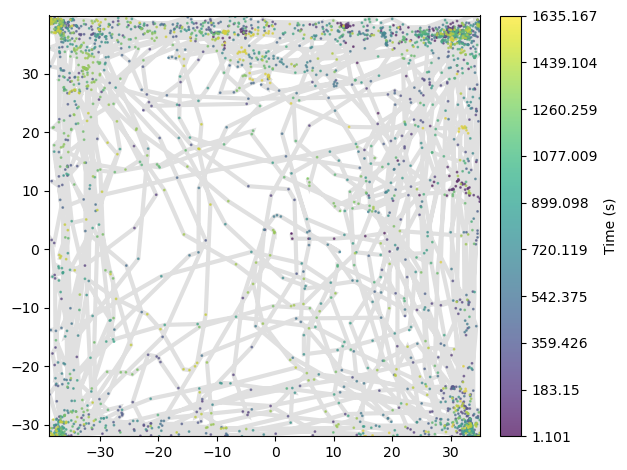

In [6]:
traja.plot(dfs_step['tr7'])

In [7]:
bord_tr3 = {'xmi':tr3['x'].min(), 'xma': tr3['x'].max(), 'ymi':tr3['y'].min(), 'yma':tr3['y'].max()}
bord_tr4 = {'xmi':tr4['x'].min(), 'xma': tr4['x'].max(), 'ymi':tr4['y'].min(), 'yma':tr4['y'].max()}
bord_tr5 = {'xmi':tr5['x'].min(), 'xma': tr5['x'].max(), 'ymi':tr5['y'].min(), 'yma':tr5['y'].max()}
bord_tr6 = {'xmi':tr6['x'].min(), 'xma': tr6['x'].max(), 'ymi':tr6['y'].min(), 'yma':tr6['y'].max()}
bord_tr7 = {'xmi':tr7['x'].min(), 'xma': tr7['x'].max(), 'ymi':tr7['y'].min(), 'yma':tr7['y'].max()}
bord_tr91 = {'xmi':tr91['x'].min(), 'xma': tr91['x'].max(), 'ymi':tr91['y'].min(), 'yma':tr91['y'].max()}
bord_tr92 = {'xmi':tr92['x'].min(), 'xma': tr92['x'].max(), 'ymi':tr92['y'].min(), 'yma':tr92['y'].max()}
bord_tr1 = {'xmi':tr1['x'].min(), 'xma': tr1['x'].max(), 'ymi':tr1['y'].min(), 'yma':tr1['y'].max()}
bord_tr2 = {'xmi':tr2['x'].min(), 'xma': tr2['x'].max(), 'ymi':tr2['y'].min(), 'yma':tr2['y'].max()}


In [8]:
borders = {'tr1': bord_tr1, 'tr2': bord_tr2, 'tr3': bord_tr3, 'tr4': bord_tr4, 'tr5': bord_tr5, 'tr6': bord_tr6, 'tr7': bord_tr7,'tr91': bord_tr91,'tr92': bord_tr92}

In [9]:
def addNearWalls(trN, bord_trN):    
    trN['near_wall'] = 0
    ylength = bord_trN['yma'] - bord_trN['ymi'] 
    xlength = bord_trN['xma'] - bord_trN['xmi'] 
    xl = bord_trN['xmi']  + xlength * 0.1
    xr = bord_trN['xma']  - xlength * 0.1
    yd = bord_trN['ymi']  + ylength * 0.1
    yu = bord_trN['yma']  - ylength * 0.1
    
    for i in range(len(trN)):     
        if trN['x'].iloc[i] < xl:
            if trN['y'].iloc[i] > yu:
                trN['near_wall'].iloc[i] = 40
            elif trN['y'].iloc[i] < yd:
                trN['near_wall'].iloc[i] = 30
            else:
                trN['near_wall'].iloc[i] = 4
        elif trN['x'].iloc[i] > xr:
            if trN['y'].iloc[i] > yu:
                trN['near_wall'].iloc[i] = 10
            elif trN['y'].iloc[i] < yd:
                trN['near_wall'].iloc[i] = 20
            else:
                trN['near_wall'].iloc[i] = 2
        elif trN['y'].iloc[i] > yu:
            trN['near_wall'].iloc[i] = 1
        elif trN['y'].iloc[i] < yd:
            trN['near_wall'].iloc[i] = 3
    print(yd, yu)
    
    return trN

C:\Users\Lenovo\AppData\Local\Temp\ipykernel_3340\1388506519.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  trN['near_wall'].iloc[i] = 1
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_3340\1388506519.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  trN['near_wall'].iloc[i] = 10
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_3340\1388506519.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  trN['near_wall'].iloc[i] = 2
C:\Users\

-37.053399999999996 37.1834
-8.364999999999998 33.235


C:\Users\Lenovo\AppData\Local\Temp\ipykernel_3340\1388506519.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  trN['near_wall'].iloc[i] = 4
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_3340\1388506519.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  trN['near_wall'].iloc[i] = 40
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_3340\1388506519.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  trN['near_wall'].iloc[i] = 2
C:\Users\

-37.7954 35.617399999999996
-39.9005 20.7195


C:\Users\Lenovo\AppData\Local\Temp\ipykernel_3340\1388506519.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  trN['near_wall'].iloc[i] = 3
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_3340\1388506519.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  trN['near_wall'].iloc[i] = 20
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_3340\1388506519.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  trN['near_wall'].iloc[i] = 2
C:\Users\

-39.8268 39.678799999999995


C:\Users\Lenovo\AppData\Local\Temp\ipykernel_3340\1388506519.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  trN['near_wall'].iloc[i] = 3
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_3340\1388506519.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  trN['near_wall'].iloc[i] = 30
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_3340\1388506519.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  trN['near_wall'].iloc[i] = 4
C:\Users\

-33.4707 36.219699999999996


C:\Users\Lenovo\AppData\Local\Temp\ipykernel_3340\1388506519.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  trN['near_wall'].iloc[i] = 2
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_3340\1388506519.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  trN['near_wall'].iloc[i] = 1
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_3340\1388506519.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  trN['near_wall'].iloc[i] = 10
C:\Users\

-24.753 32.775


C:\Users\Lenovo\AppData\Local\Temp\ipykernel_3340\1388506519.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  trN['near_wall'].iloc[i] = 2
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_3340\1388506519.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  trN['near_wall'].iloc[i] = 10
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_3340\1388506519.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  trN['near_wall'].iloc[i] = 20
C:\Users

-33.9952 33.9952


C:\Users\Lenovo\AppData\Local\Temp\ipykernel_3340\1388506519.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  trN['near_wall'].iloc[i] = 2
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_3340\1388506519.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  trN['near_wall'].iloc[i] = 1
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_3340\1388506519.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  trN['near_wall'].iloc[i] = 10
C:\Users\

-37.9063 36.1313


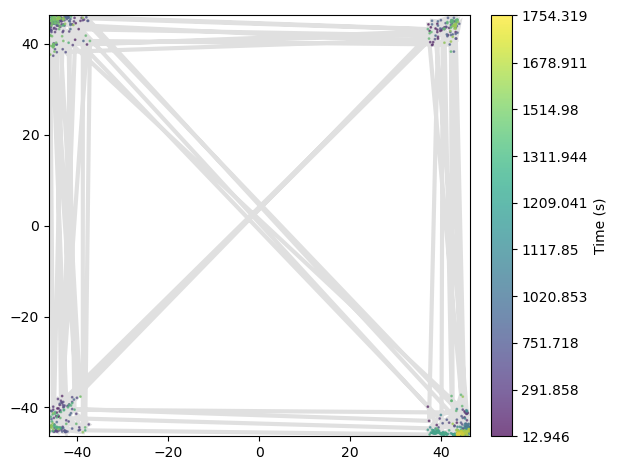

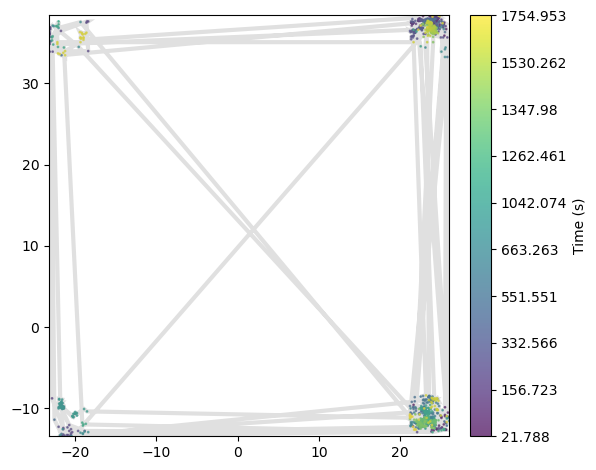

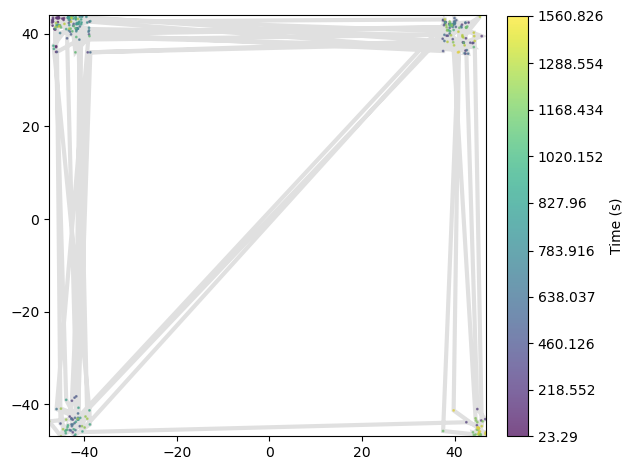

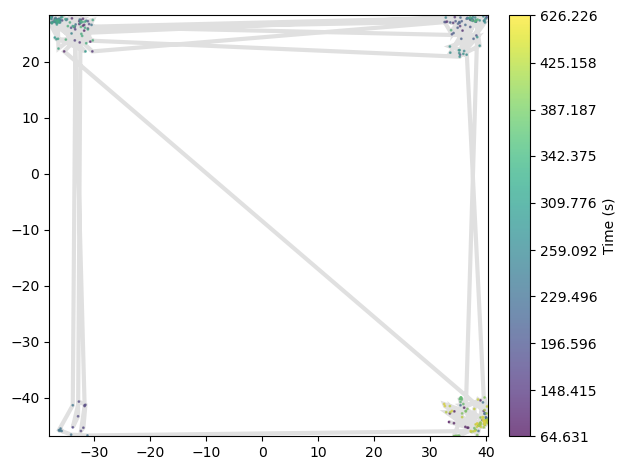

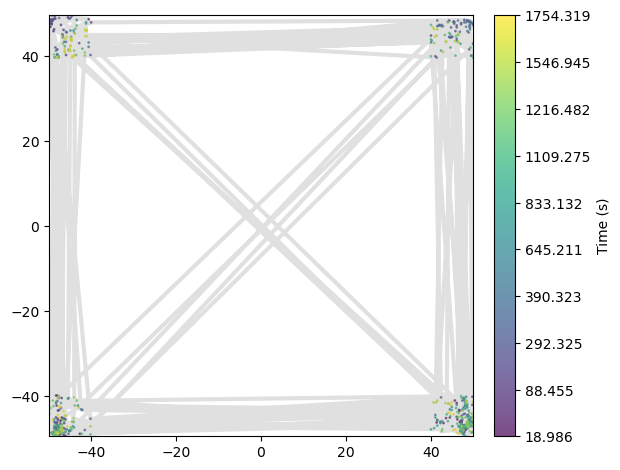

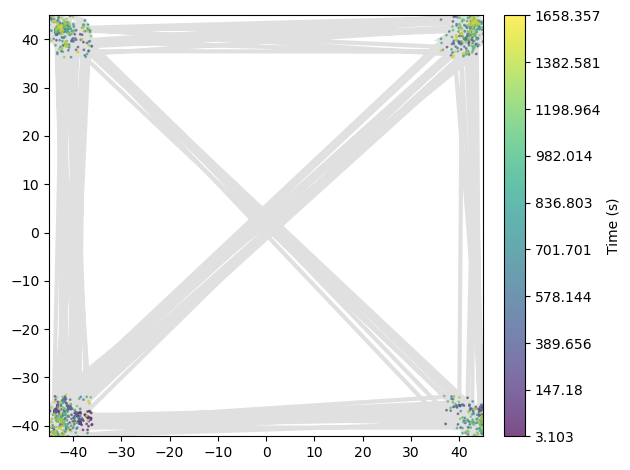

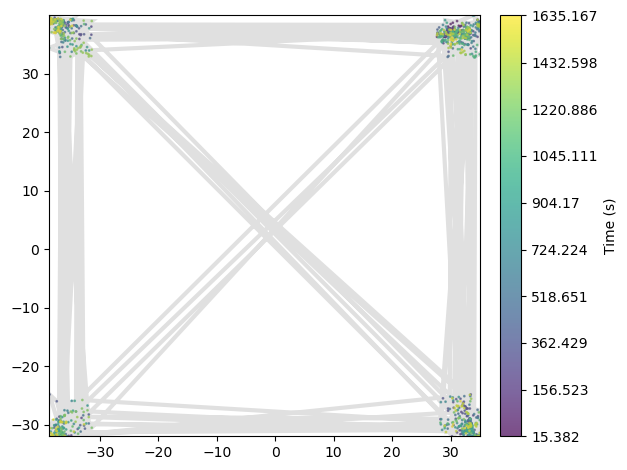

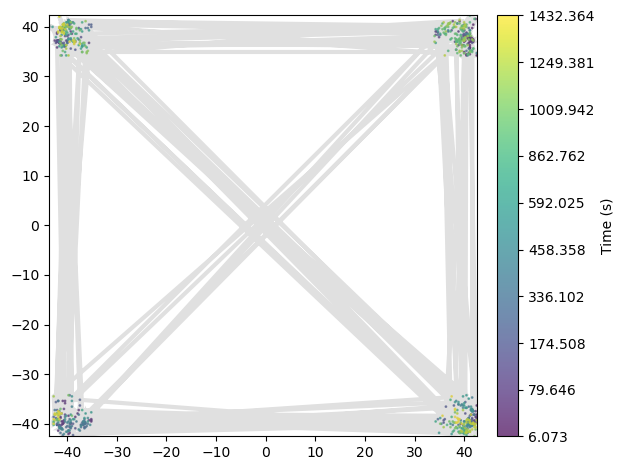

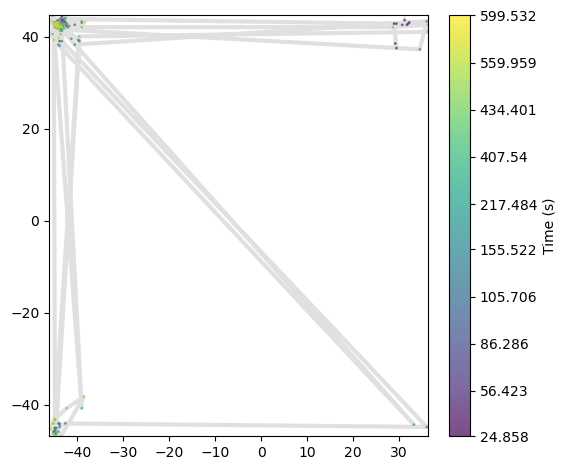

In [10]:
for i in dfs_step:
    dfs_step[i] = addNearWalls(dfs_step[i],borders[i])
    traja.plot(dfs_step[i].loc[dfs_step[i]['near_wall'] >= 10])

##### давайте проверить какая длина шагов в разных зонах

In [11]:
def addStepLength(trN):    
    trN['step_length'] = 0
    for i in range(1, len(trN)):
        l = ((trN['x'].iloc[i] - trN['x'].iloc[i-1]) ** 2 + (trN['y'].iloc[i] - trN['y'].iloc[i-1]) ** 2) ** 0.5
        trN['step_length'].iloc[i] = l
    
    return trN

In [12]:
for i in dfs_step:
    dfs_step[i] = addStepLength(dfs_step[i])
    

C:\Users\Lenovo\AppData\Local\Temp\ipykernel_3340\1782672783.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  trN['step_length'].iloc[i] = l
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_3340\1782672783.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  trN['step_length'].iloc[i] = l
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_3340\1782672783.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  trN['step_length'].iloc[i] = l
C:\User

In [13]:
cornMean = []
wallMean = []
centMean = []
for i in dfs_step:
    df = dfs_step[i]
    co = df.loc[df['near_wall']>=10]['step_length'].mean()
    w = df.loc[(df['near_wall']>=1) & (df['near_wall']<=4)]['step_length'].mean()
    ce = df.loc[(df['near_wall']==0) & (df['near_wall']==0)]['step_length'].mean()
    cornMean.append(co)
    centMean.append(ce)
    wallMean.append(w)
    

In [14]:
for i in cornMean:
    print(i)

1.0662234952755074
0.5200364076191811
2.8983343687172956
2.2469028522817975
3.8111306693571776
2.550809298387065
1.7367657753487742
2.4321883151769677
2.057394414535499


In [15]:
for i in centMean:
    print(i)

5.865621770839038
2.412504463601352
7.151027676809649
3.270158375990965
10.81991280877006
7.38406213006336
6.911544607500937
8.418673388558842
10.174901743518799


In [16]:
for i in wallMean:
    print(i)

3.5452797425442553
1.3895374558909963
4.849628743315988
5.088213126260652
10.157339944913872
5.06952477473764
3.9876193487352047
5.17009024383969
1.2164791372982018


In [17]:
df = dfs_step['tr1']
print(df.loc[df['near_wall']>=10]['step_length'].mean())
print(df.loc[df['near_wall']>=10]['step_length'].median())

1.0662234952755074
0.2906888370749784


#####  давайте проверим зависимость изменения угла от угла рядом со стенами

In [18]:
DfsStep13 = {}
DfsStep24 = {}
for i in dfs_step:
    df = dfs_step[i]
    DfsStep13[i] = df.loc[(df['near_wall']==1) | (df['near_wall']==3)]
    DfsStep13[i] = DfsStep13[i].reset_index()
    DfsStep13[i] = DfsStep13[i].drop(['index'], axis=1)
    DfsStep24[i] = df.loc[(df['near_wall']==2) | (df['near_wall']==4)]
    DfsStep24[i] = DfsStep24[i].reset_index()
    DfsStep24[i] = DfsStep24[i].drop(['index'], axis=1)

In [19]:
DfsStep13['tr1']

,time,x,y,Vx,Vy,V,angles,delta_angle,near_wall,step_length
0,8.842,11.713,38.134,0.000000,3.939394,3.939394,90.000000,-36.060689,1,7.220134
1,9.376,10.152,40.737,0.000000,-3.939394,3.939394,-90.000000,-180.000000,1,3.035182
2,9.877,11.323,39.045,3.823529,-15.294118,15.764816,-75.963757,14.036243,1,2.057694
3,10.410,11.844,38.785,3.969697,11.848485,12.495803,71.477174,147.440931,1,0.582272
4,10.911,17.570,41.908,3.939394,0.000000,3.939394,0.000000,-71.477174,1,6.522285
...,...,...,...,...,...,...,...,...,...,...
927,1601.900,-23.947,40.086,19.727273,3.939394,20.116762,11.293006,11.293006,1,1.455412
928,1602.401,-13.405,41.518,22.970588,0.000000,22.970588,0.000000,-11.293006,1,10.638815
929,1602.901,-7.419,41.388,15.757576,0.000000,15.757576,0.000000,0.000000,1,5.987411
930,1603.402,8.460,39.175,42.117647,-7.647059,42.806234,-10.290762,-10.290762,1,16.032467


<Figure size 640x480 with 0 Axes>

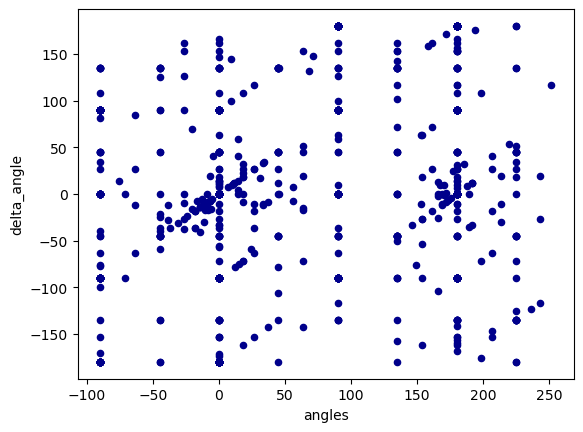

<Figure size 640x480 with 0 Axes>

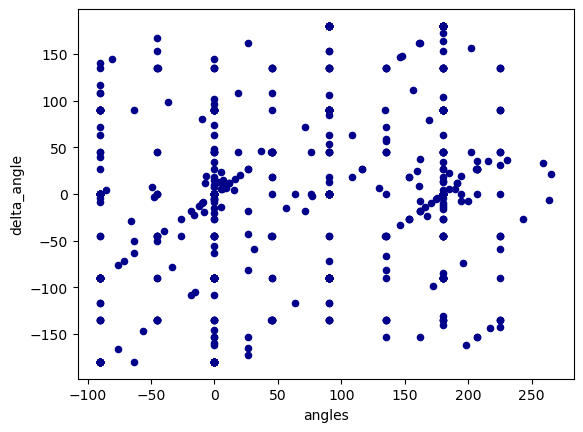

<Figure size 640x480 with 0 Axes>

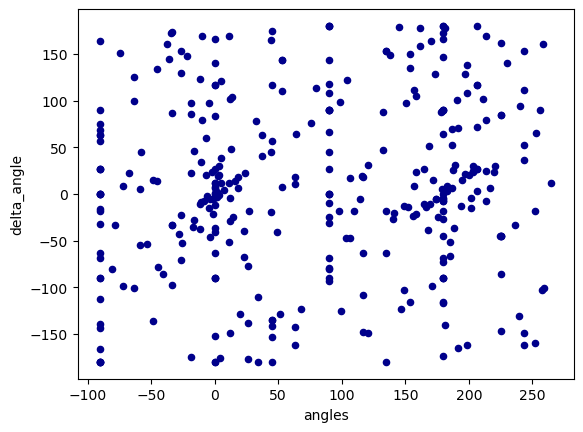

<Figure size 640x480 with 0 Axes>

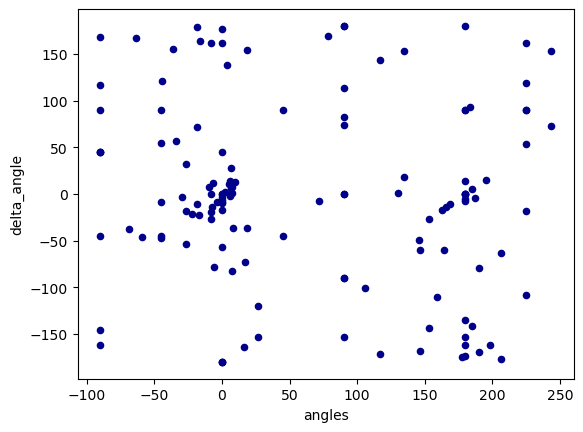

<Figure size 640x480 with 0 Axes>

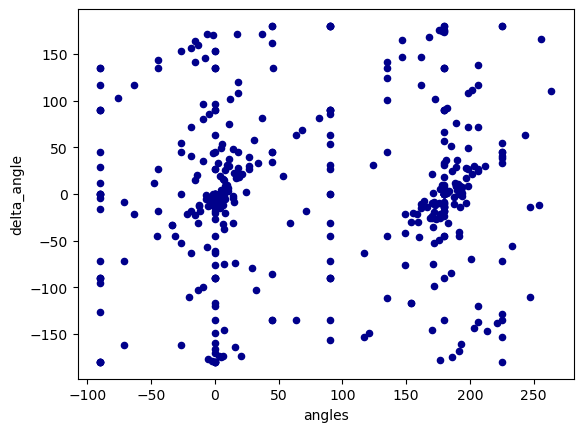

<Figure size 640x480 with 0 Axes>

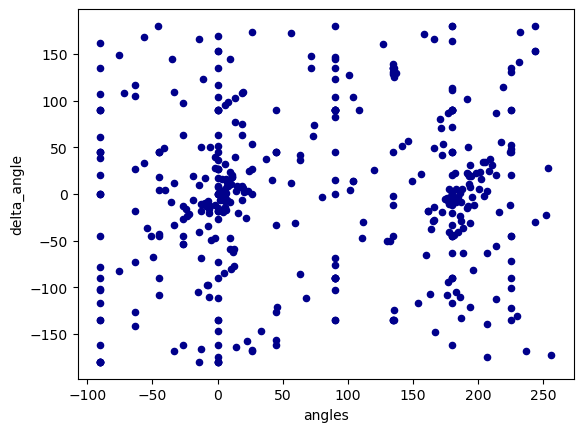

<Figure size 640x480 with 0 Axes>

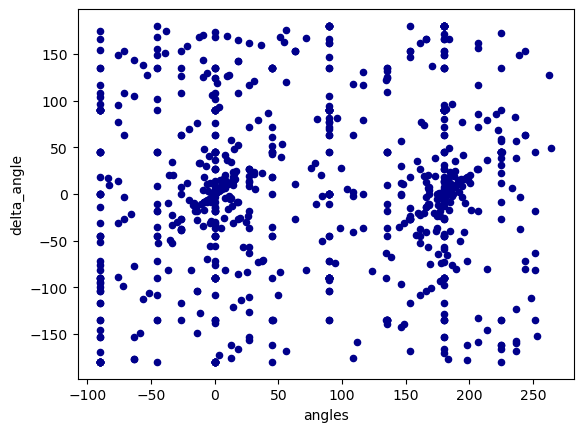

<Figure size 640x480 with 0 Axes>

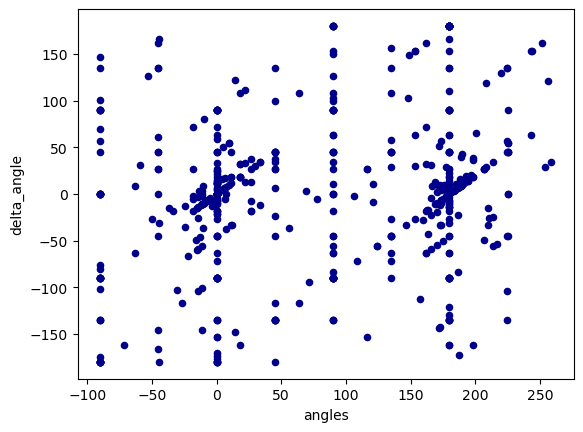

<Figure size 640x480 with 0 Axes>

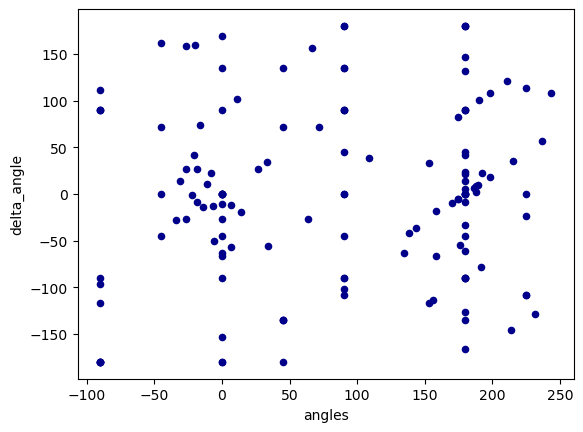

In [20]:
for i in DfsStep13:
    plt.figure()
    DfsStep13[i].plot.scatter(x='angles',y='delta_angle', c='DarkBlue')
    plt.show()

<Figure size 640x480 with 0 Axes>

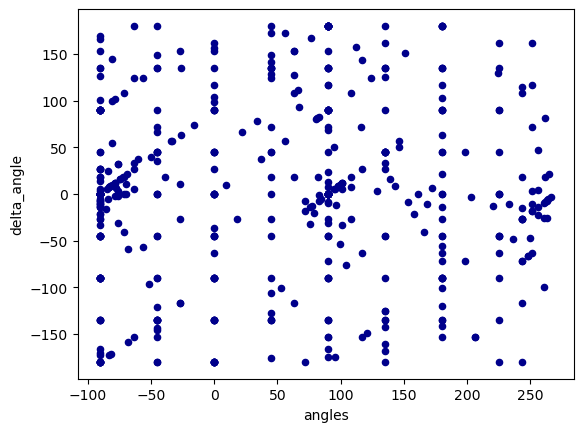

<Figure size 640x480 with 0 Axes>

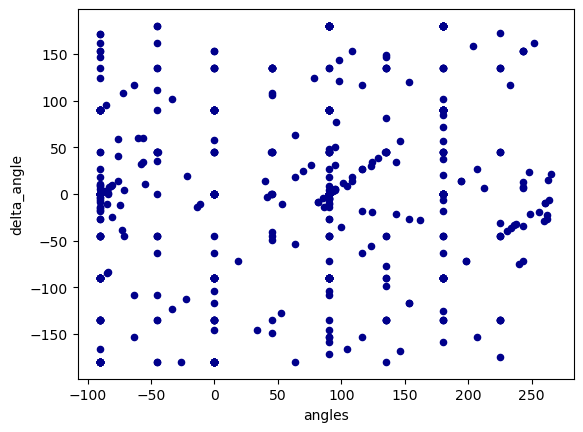

<Figure size 640x480 with 0 Axes>

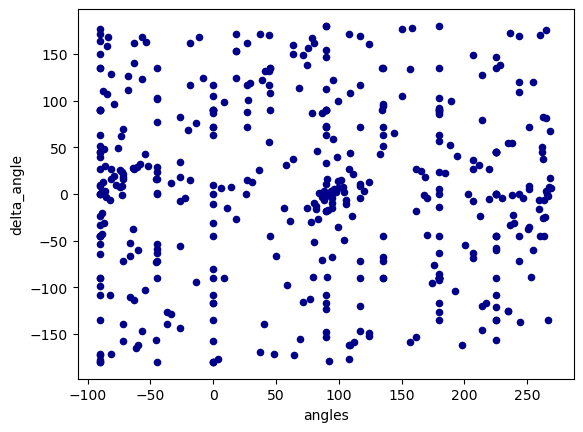

<Figure size 640x480 with 0 Axes>

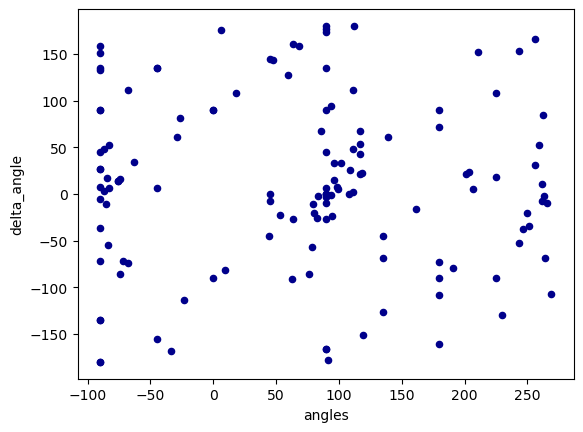

<Figure size 640x480 with 0 Axes>

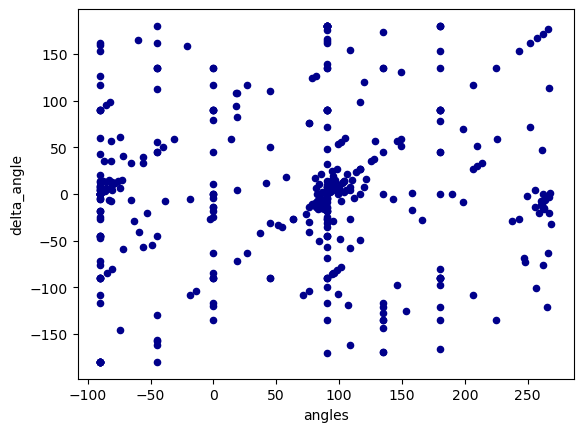

<Figure size 640x480 with 0 Axes>

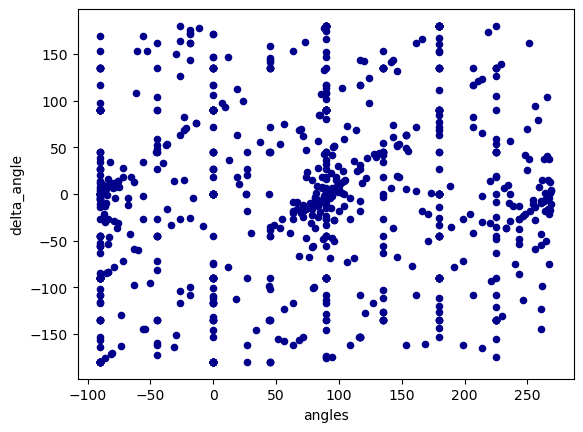

<Figure size 640x480 with 0 Axes>

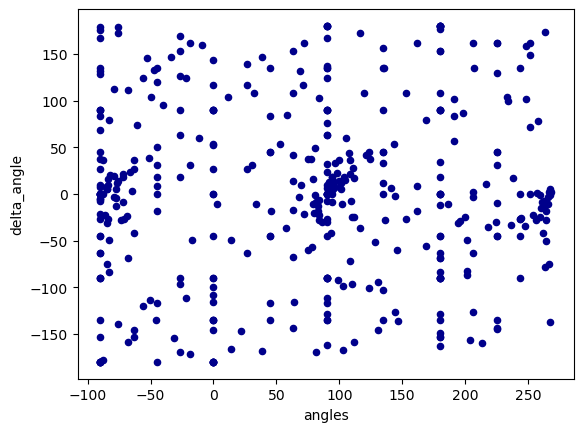

<Figure size 640x480 with 0 Axes>

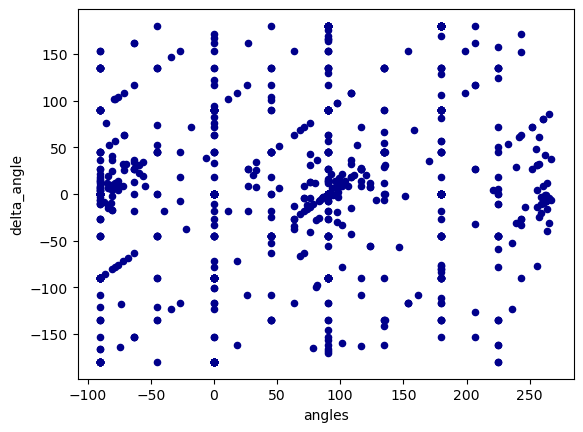

<Figure size 640x480 with 0 Axes>

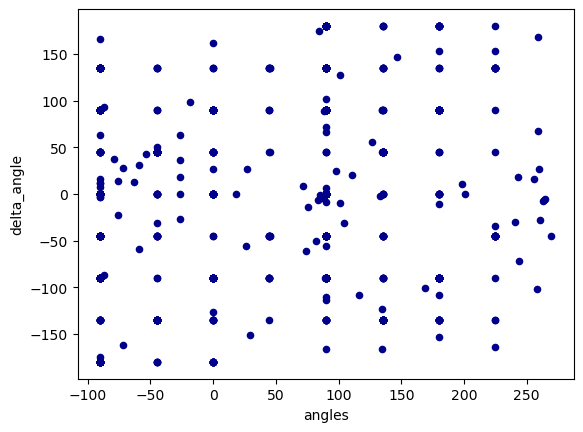

In [21]:
for i in DfsStep24:
    plt.figure()
    DfsStep24[i].plot.scatter(x='angles',y='delta_angle', c='DarkBlue')
    plt.show()

DfsStep1[i].plot.scatter(x='angles',y='delta_angle', c='darkblue')

<Figure size 640x480 with 0 Axes>

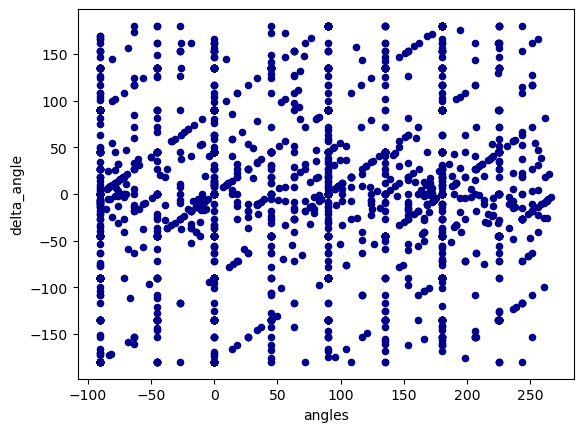

<Figure size 640x480 with 0 Axes>

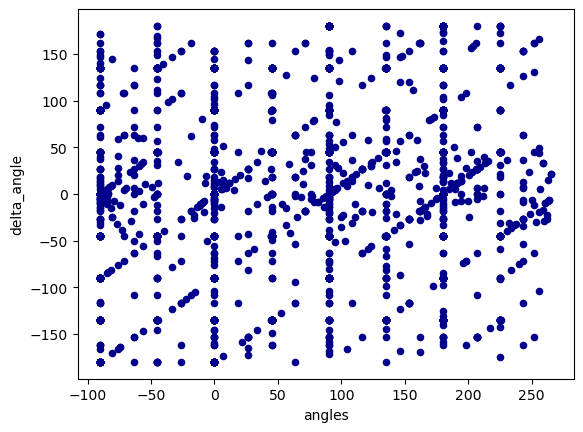

<Figure size 640x480 with 0 Axes>

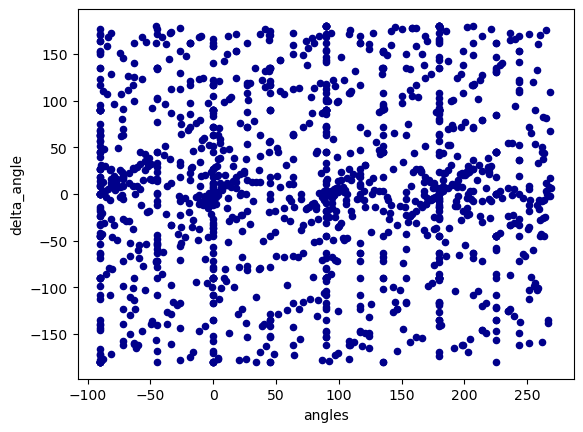

<Figure size 640x480 with 0 Axes>

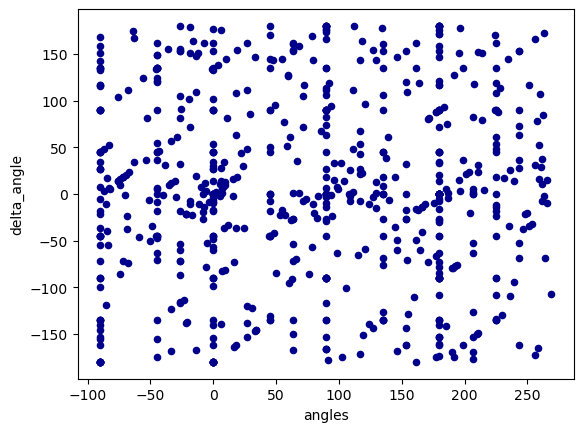

<Figure size 640x480 with 0 Axes>

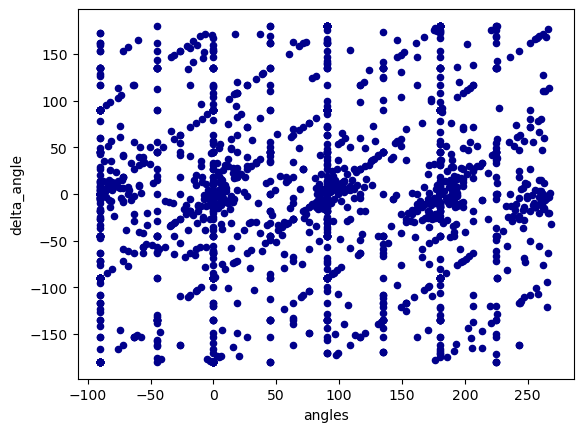

<Figure size 640x480 with 0 Axes>

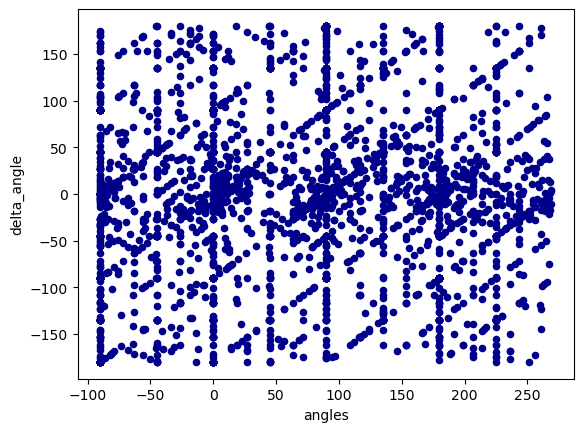

<Figure size 640x480 with 0 Axes>

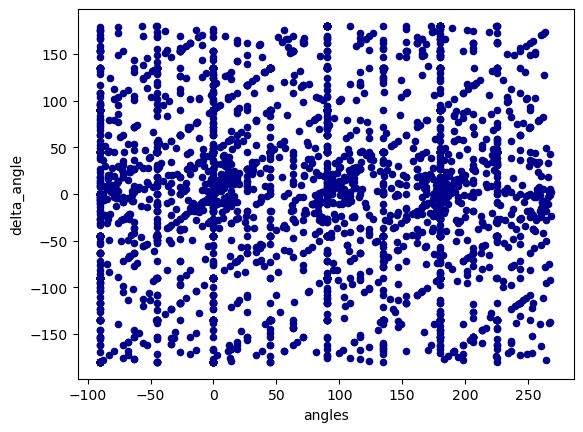

<Figure size 640x480 with 0 Axes>

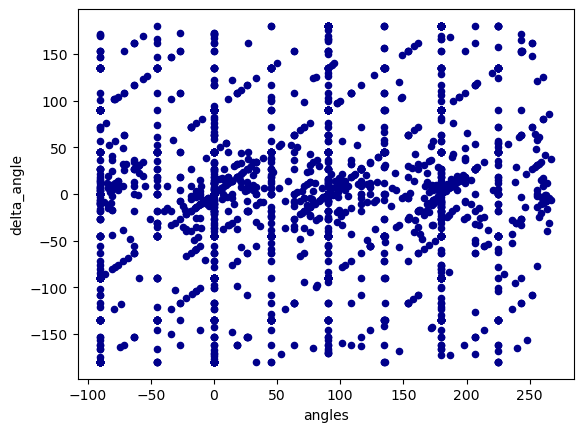

<Figure size 640x480 with 0 Axes>

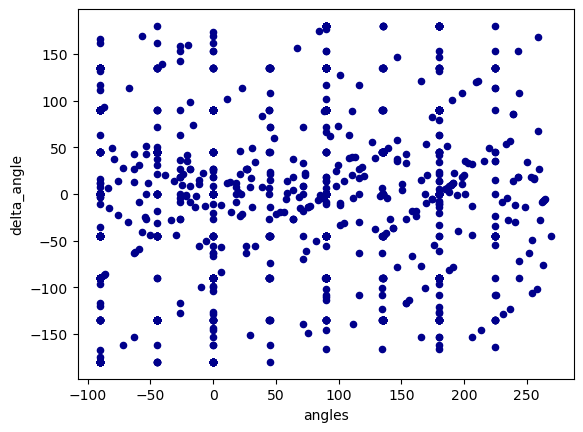

In [22]:
for i in dfs_step:
    plt.figure()
    dfs_step[i].plot.scatter(x='angles',y='delta_angle', c='DarkBlue')
    plt.show()

In [23]:
DfsStep1 = {}
DfsStep2 = {}
DfsStep3 = {}
DfsStep4 = {}
for i in dfs_step:
    df = dfs_step[i]
    DfsStep1[i] = df.loc[df['near_wall']==1]
    DfsStep1[i] = DfsStep1[i].reset_index()
    DfsStep1[i] = DfsStep1[i].drop(['index'], axis=1)
    DfsStep2[i] = df.loc[df['near_wall']==2]
    DfsStep2[i] = DfsStep2[i].reset_index()
    DfsStep2[i] = DfsStep2[i].drop(['index'], axis=1)
    DfsStep3[i] = df.loc[df['near_wall']==3]
    DfsStep3[i] = DfsStep3[i].reset_index()
    DfsStep3[i] = DfsStep3[i].drop(['index'], axis=1)
    DfsStep4[i] = df.loc[df['near_wall']==4]
    DfsStep4[i] = DfsStep4[i].reset_index()
    DfsStep4[i] = DfsStep4[i].drop(['index'], axis=1)

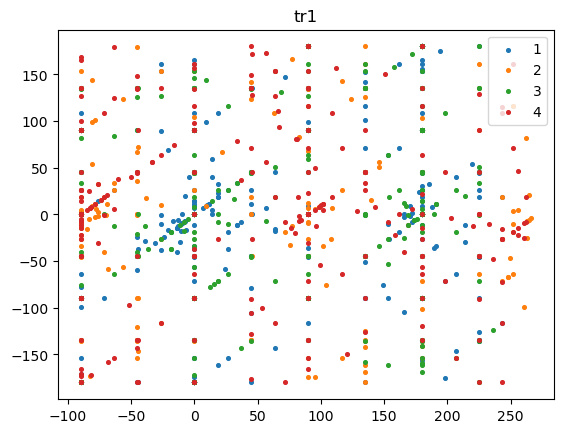

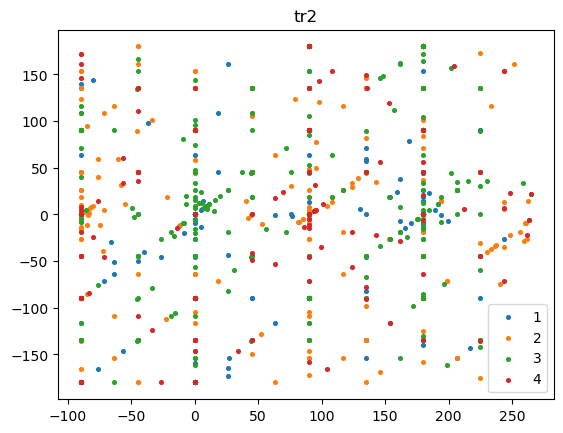

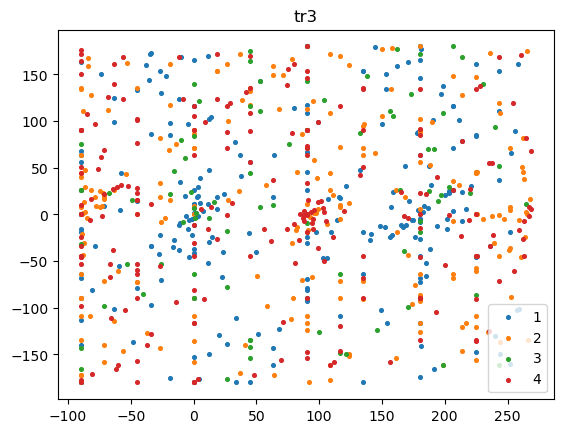

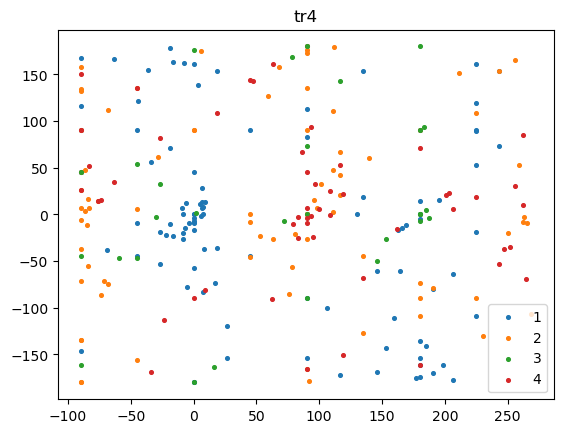

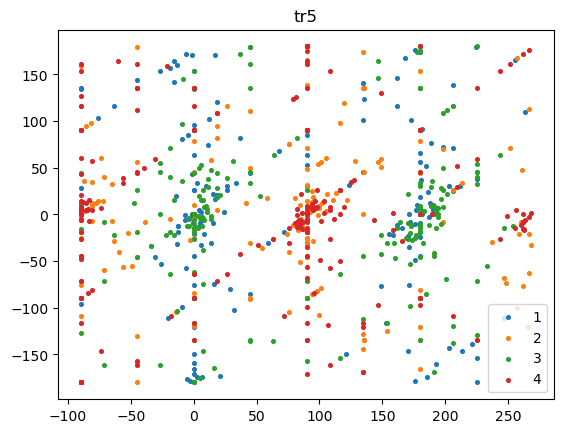

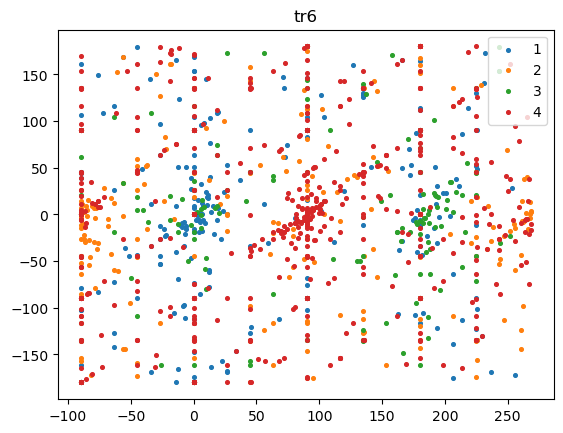

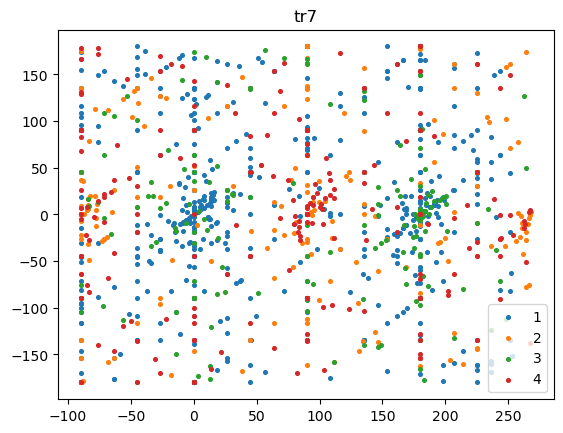

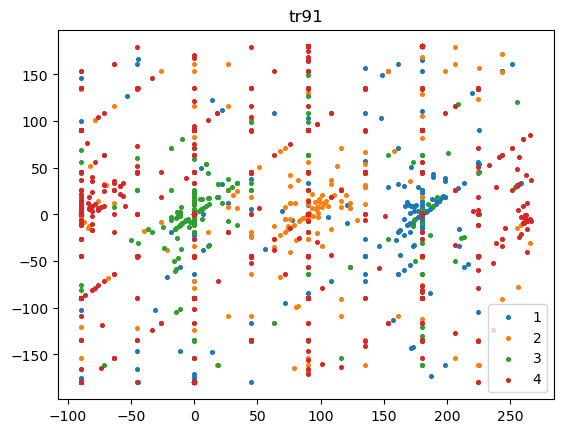

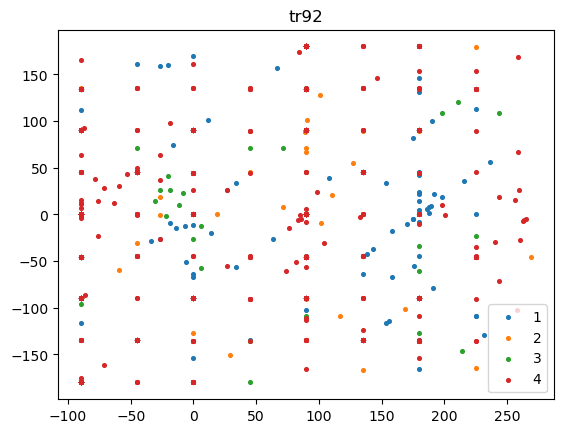

In [24]:
#хех на самом деле я ут беру все дфс степ а не только 2
for i in DfsStep2:
    plt.figure()
    plt.scatter(DfsStep1[i]['angles'], DfsStep1[i]['delta_angle'], s=7, label = '1')
    plt.scatter(DfsStep2[i]['angles'], DfsStep2[i]['delta_angle'],s=7, label='2')
    plt.scatter(DfsStep3[i]['angles'], DfsStep3[i]['delta_angle'],s=7, label='3')
    plt.scatter(DfsStep4[i]['angles'], DfsStep4[i]['delta_angle'],s=7, label='4')
    #DfsStep1[i].plot.scatter(x='angles',y='delta_angle', c='darkblue')
    #DfsStep2[i].plot.scatter(x='angles',y='delta_angle', c='darkmagenta')
    #DfsStep3[i].plot.scatter(x='angles',y='delta_angle', c='darkred')
    #DfsStep4[i].plot.scatter(x='angles',y='delta_angle', c='darkgoldenrod')
    plt.title(i)
    plt.legend()
    plt.show()

##### посчитаем сколько значений в 13 и 24 зонах, в которых угол в окрестностях таргетных углов (параллельных стене) и остальных (обычных) углов

In [74]:
#parallel
for i in DfsStep13:
    kk = DfsStep13[i].loc[((DfsStep13[i]['angles']>=-25) & (DfsStep13[i]['angles']<=25)) | ((DfsStep13[i]['angles']>=155) & (DfsStep13[i]['angles']<=205))]  
    print(i)
    print(len(kk))

tr1
523
tr2
390
tr3
155
tr4
73
tr5
267
tr6
233
tr7
426
tr91
364
tr92
80


In [75]:
#regular
for i in DfsStep13:
    kk = DfsStep13[i].loc[(DfsStep13[i]['angles']<-25) | ((DfsStep13[i]['angles']<155) & (DfsStep13[i]['angles']>25)) | (DfsStep13[i]['angles']>205)]  
    print(i)
    print(len(kk))

tr1
409
tr2
372
tr3
197
tr4
62
tr5
145
tr6
205
tr7
429
tr91
225
tr92
65


In [89]:
del DfsStep24['tr92']

KeyError: 'tr92'

In [88]:
#parallel
for i in DfsStep24:
    kk = DfsStep24[i].loc[(DfsStep24[i]['angles']<=-65) | ((DfsStep24[i]['angles']>=65) & (DfsStep24[i]['angles']<=115)) | (DfsStep24[i]['angles']>=245)]  
    print(i)
    print(len(kk))

tr1
271
tr2
287
tr3
199
tr4
82
tr5
278
tr6
425
tr7
213
tr91
452


In [92]:
#regular
for i in DfsStep24:
    kk = DfsStep24[i].loc[((DfsStep24[i]['angles']>-65) & (DfsStep24[i]['angles']<65)) | ((DfsStep24[i]['angles']>115) & (DfsStep24[i]['angles']<245))]  
    print(i)
    print(len(kk))

tr1
257
tr2
344
tr3
261
tr4
53
tr5
152
tr6
504
tr7
224
tr91
891


In [94]:
DfsStep13

{'tr1':          time       x       y         Vx         Vy          V     angles  \
 0       8.842  11.713  38.134   0.000000   3.939394   3.939394  90.000000   
 1       9.376  10.152  40.737   0.000000  -3.939394   3.939394 -90.000000   
 2       9.877  11.323  39.045   3.823529 -15.294118  15.764816 -75.963757   
 3      10.410  11.844  38.785   3.969697  11.848485  12.495803  71.477174   
 4      10.911  17.570  41.908   3.939394   0.000000   3.939394   0.000000   
 ..        ...     ...     ...        ...        ...        ...        ...   
 927  1601.900 -23.947  40.086  19.727273   3.939394  20.116762  11.293006   
 928  1602.401 -13.405  41.518  22.970588   0.000000  22.970588   0.000000   
 929  1602.901  -7.419  41.388  15.757576   0.000000  15.757576   0.000000   
 930  1603.402   8.460  39.175  42.117647  -7.647059  42.806234 -10.290762   
 931  1603.902  27.331  40.086  39.424242   0.000000  39.424242   0.000000   
 
      delta_angle  near_wall  step_length  
 0     -36.

##### соберем нужные условия и сделаем общую таблицу для 13 паралл, 13 рег, 24 пар, 24 рег

In [104]:
#for 13
par13 = []
l = 233
for i in DfsStep13:
    kk = DfsStep13[i].loc[((DfsStep13[i]['angles']>=-25) & (DfsStep13[i]['angles']<=25)) | ((DfsStep13[i]['angles']>=155) & (DfsStep13[i]['angles']<=205))]
    if len(kk) > l:
        kk = kk.iloc[0:l]
    print(len(kk))
    par13.append(kk)
dfPar13 = pd.concat(par13)

#for 13
reg13 = []
l = 197
for i in DfsStep13:
    kk = DfsStep13[i].loc[(DfsStep13[i]['angles']<-25) | ((DfsStep13[i]['angles']<155) & (DfsStep13[i]['angles']>25)) | (DfsStep13[i]['angles']>205)] 
    if len(kk) > l:
        kk = kk.iloc[0:l]
    print(len(kk))
    reg13.append(kk)
dfReg13 = pd.concat(reg13)




233
233
155
73
233
233
233
233
80
197
197
197
62
145
197
197
197
65


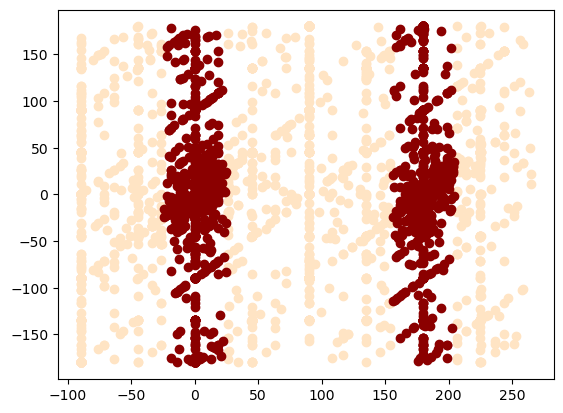

In [117]:
plt.scatter(dfReg13['angles'], dfReg13['delta_angle'], color='bisque')
plt.scatter(dfPar13['angles'], dfPar13['delta_angle'], color='darkred')

In [119]:
#for 24
par24 = []
l = 213
for i in DfsStep24:
    kk = DfsStep24[i].loc[(DfsStep24[i]['angles']<=-65) | ((DfsStep24[i]['angles']>=65) & (DfsStep24[i]['angles']<=115)) | (DfsStep24[i]['angles']>=245)]  
    if len(kk) > l:
        kk = kk.iloc[0:l]
    print(len(kk))
    par24.append(kk)
dfPar24 = pd.concat(par24)

#for 24
reg24 = []
l = 200
for i in DfsStep24:
    kk = DfsStep24[i].loc[((DfsStep24[i]['angles']>-65) & (DfsStep24[i]['angles']<65)) | ((DfsStep24[i]['angles']>115) & (DfsStep24[i]['angles']<245))]  
    if len(kk) > l:
        kk = kk.iloc[0:l]
    print(len(kk))
    reg24.append(kk)
dfReg24 = pd.concat(reg24)


213
213
199
82
213
213
213
213
200
200
200
53
152
200
200
200


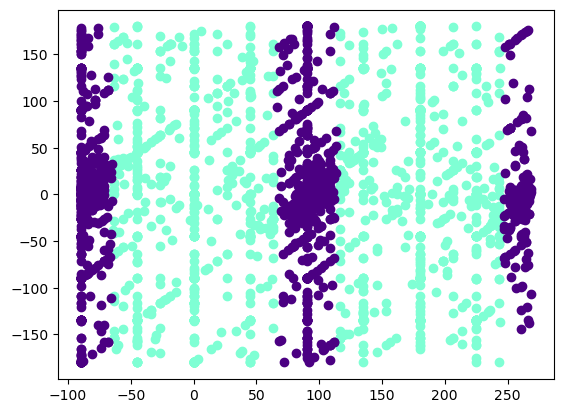

In [120]:
plt.scatter(dfReg24['angles'], dfReg24['delta_angle'], color='aquamarine')
plt.scatter(dfPar24['angles'], dfPar24['delta_angle'], color='indigo')

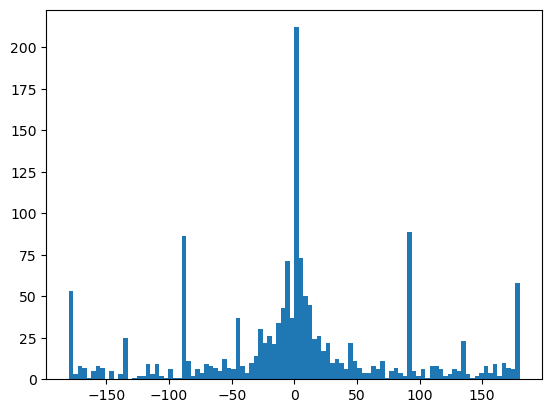

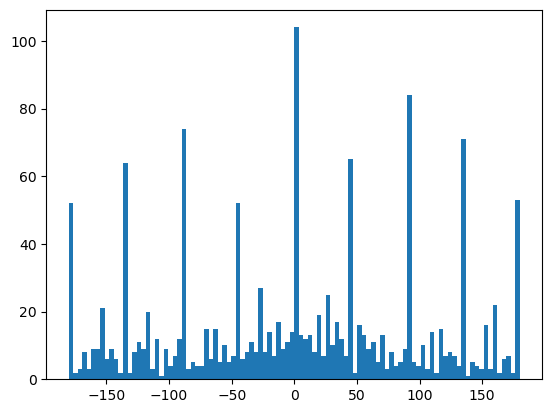

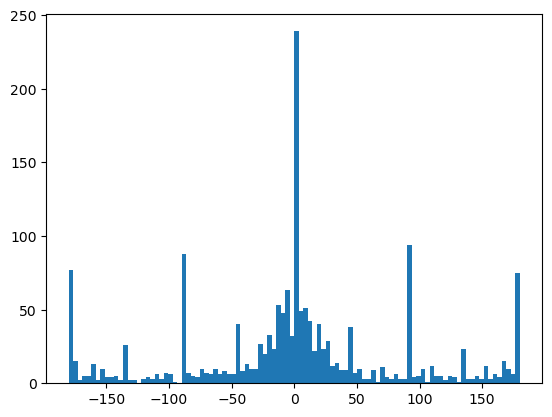

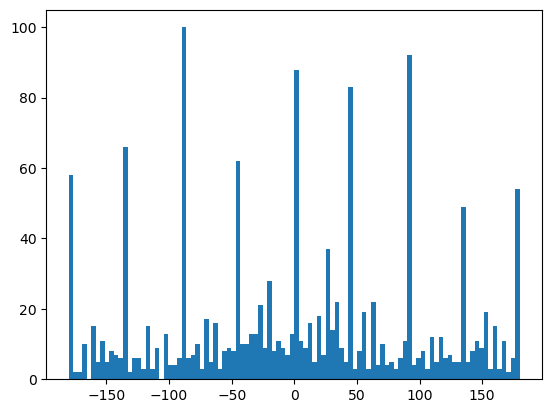

In [125]:
wall_hist = {}
plt.figure()
y, binEdges, _ = plt.hist(dfPar24['delta_angle'], 100)
plt.show()
x = 0.5 * (binEdges[1:] + binEdges[:-1])
wall_hist['par24'] = [x, y]

plt.figure()
y, binEdges, _ = plt.hist(dfReg24['delta_angle'], 100)
plt.show()
x = 0.5 * (binEdges[1:] + binEdges[:-1])
wall_hist['reg24'] = [x, y]

plt.figure()
y, binEdges, _ = plt.hist(dfPar13['delta_angle'], 100)
plt.show()
x = 0.5 * (binEdges[1:] + binEdges[:-1])
wall_hist['par13'] = [x, y]

plt.figure()
y, binEdges, _ = plt.hist(dfReg13['delta_angle'], 100)
plt.show()
x = 0.5 * (binEdges[1:] + binEdges[:-1])
wall_hist['reg13'] = [x, y]


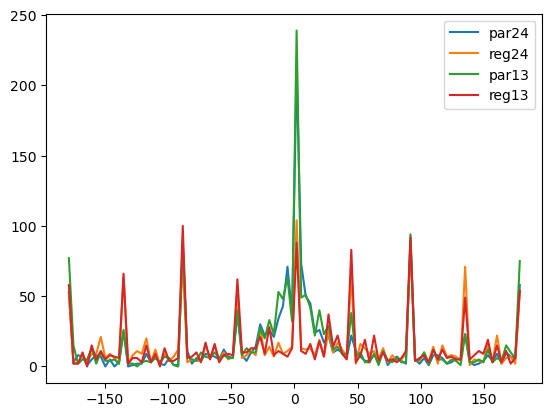

In [128]:
for i in wall_hist:
    plt.plot(wall_hist[i][0], wall_hist[i][1], label=i)
plt.legend()

In [129]:
wall_hist

{'par24': [array([-178.2, -174.6, -171. , -167.4, -163.8, -160.2, -156.6, -153. ,
         -149.4, -145.8, -142.2, -138.6, -135. , -131.4, -127.8, -124.2,
         -120.6, -117. , -113.4, -109.8, -106.2, -102.6,  -99. ,  -95.4,
          -91.8,  -88.2,  -84.6,  -81. ,  -77.4,  -73.8,  -70.2,  -66.6,
          -63. ,  -59.4,  -55.8,  -52.2,  -48.6,  -45. ,  -41.4,  -37.8,
          -34.2,  -30.6,  -27. ,  -23.4,  -19.8,  -16.2,  -12.6,   -9. ,
           -5.4,   -1.8,    1.8,    5.4,    9. ,   12.6,   16.2,   19.8,
           23.4,   27. ,   30.6,   34.2,   37.8,   41.4,   45. ,   48.6,
           52.2,   55.8,   59.4,   63. ,   66.6,   70.2,   73.8,   77.4,
           81. ,   84.6,   88.2,   91.8,   95.4,   99. ,  102.6,  106.2,
          109.8,  113.4,  117. ,  120.6,  124.2,  127.8,  131.4,  135. ,
          138.6,  142.2,  145.8,  149.4,  153. ,  156.6,  160.2,  163.8,
          167.4,  171. ,  174.6,  178.2]),
  array([ 53.,   3.,   8.,   7.,   1.,   5.,   8.,   7.,   0.,   5.,   0

In [130]:
import pickle
with open('angWallsDistr.pkl', 'wb') as fp:
    pickle.dump(wall_hist, fp)

### вернемся к нашему анализу распределения изменения углов

In [27]:
dfs_step['tr6']

,time,x,y,Vx,Vy,V,angles,delta_angle,near_wall,step_length
0,1.001,-2.749,-17.252,0.000000,0.000000,0.000000,221.218018,0.000000,0,0.000000
1,1.502,-11.565,-25.594,-16.735294,-19.529412,25.719020,229.405812,8.187795,0,12.137167
2,2.035,-22.466,-32.798,-31.606061,-17.242424,36.003392,208.614308,-20.791504,0,13.066347
3,2.536,-35.642,-37.822,-28.727273,-8.606061,29.988672,196.677062,-11.937246,3,14.101332
4,3.103,-40.571,-40.855,2.878788,2.878788,4.071221,45.000000,-151.677062,30,5.787411
...,...,...,...,...,...,...,...,...,...,...
3027,1660.025,38.580,35.547,0.000000,-2.878788,2.878788,-90.000000,0.000000,2,0.212426
3028,1660.526,40.097,35.831,16.735294,0.000000,16.735294,0.000000,90.000000,2,1.543355
3029,1661.026,41.329,33.746,2.878788,-2.878788,4.071221,-45.000000,-45.000000,2,2.421786
3030,1661.527,41.140,30.523,0.000000,-5.588235,5.588235,-90.000000,-45.000000,2,3.228537


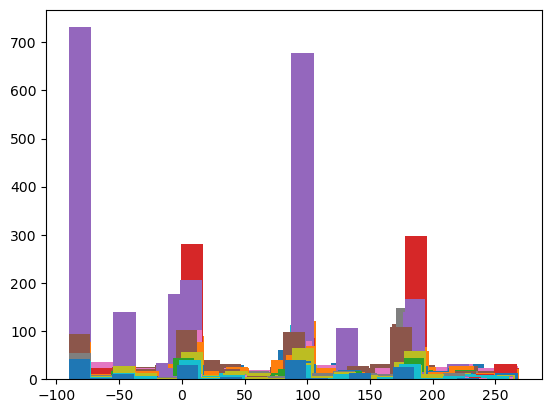

In [28]:
all_hist = {}
for numb in [0, 1, 2, 3, 4, 10, 20, 30, 40]:
    all_hist[str(numb)] = {}
    for na in names:
        dffor1line = dfs_step[na].loc[dfs_step[na]['near_wall'] == numb]
        y, binEdges, _ = plt.hist(dffor1line['angles'], 20)
        x = 0.5 * (binEdges[1:] + binEdges[:-1])
        all_hist[str(numb)][na] = [x, y]

In [29]:
all_hist

{'0': {'tr1': [array([-81.28274831, -63.84824494, -46.41374156, -28.97923818,
          -11.54473481,   5.88976857,  23.32427195,  40.75877532,
           58.1932787 ,  75.62778207,  93.06228545, 110.49678883,
          127.9312922 , 145.36579558, 162.80029896, 180.23480233,
          197.66930571, 215.10380909, 232.53831246, 249.97281584]),
   array([54., 13., 25.,  7.,  7., 55.,  7., 30., 18., 13., 60., 13., 33.,
          17., 14., 62., 16., 19., 32., 21.])],
  'tr2': [array([-81.281741  , -63.84522301, -46.40870501, -28.97218702,
          -11.53566902,   5.90084898,  23.33736697,  40.77388497,
           58.21040296,  75.64692096,  93.08343895, 110.51995695,
          127.95647494, 145.39299294, 162.82951093, 180.26602893,
          197.70254693, 215.13906492, 232.57558292, 250.01210091]),
   array([57., 11., 17.,  1.,  3., 44.,  0., 21.,  6.,  5., 65.,  6., 22.,
           7.,  8., 44.,  6., 10., 10., 15.])],
  'tr3': [array([-81.04843733, -63.14531199, -45.24218665, -27.33906131

pwd
C:\\Users\\Lenovo\\1navigation\\angles_hist\\all_angles\\

### блин мы снова построили гистограммы для углов а не для изменения углов

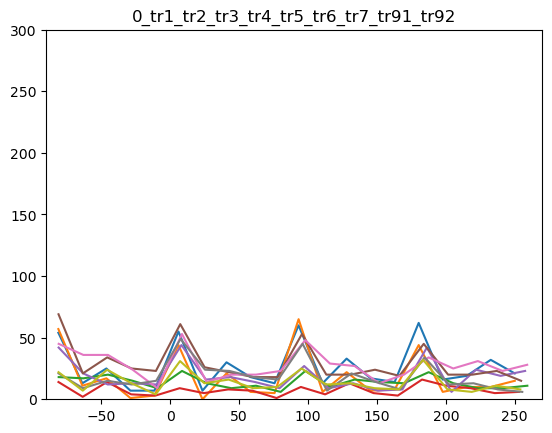

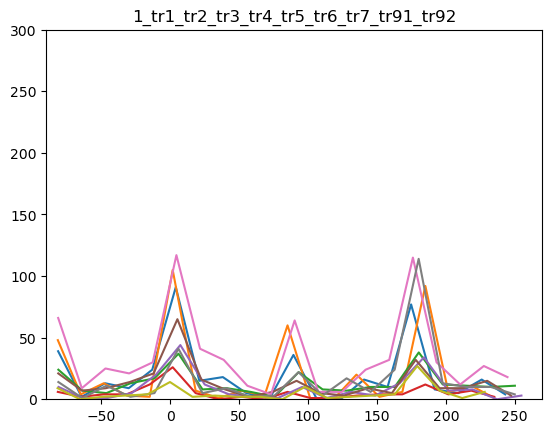

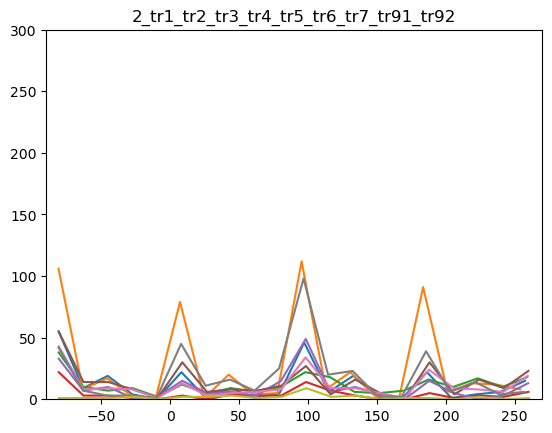

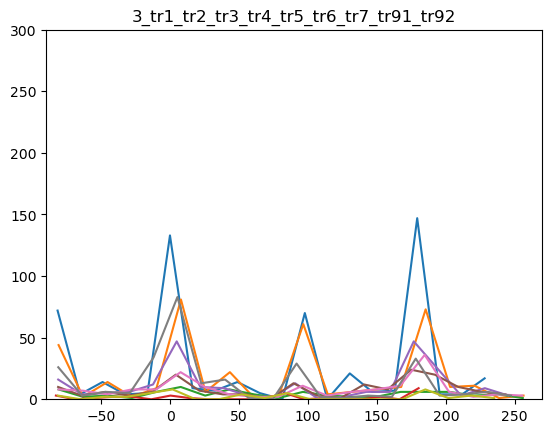

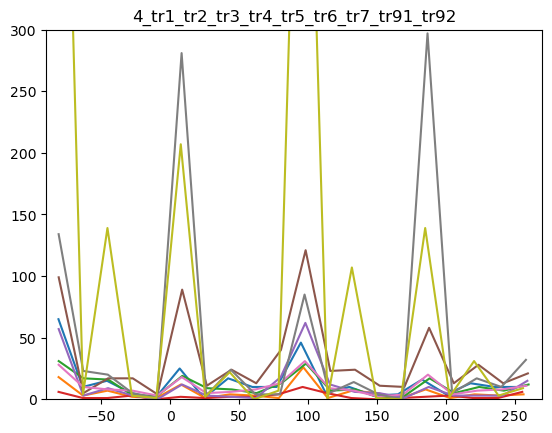

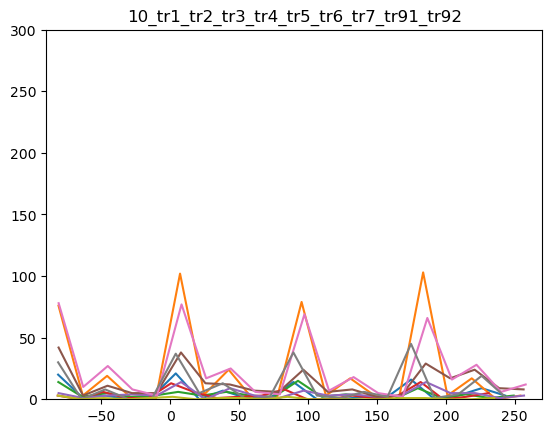

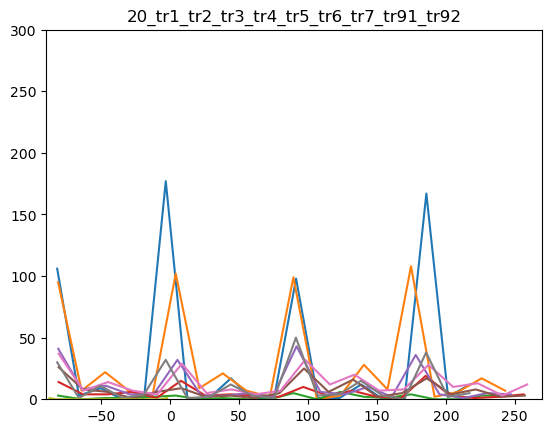

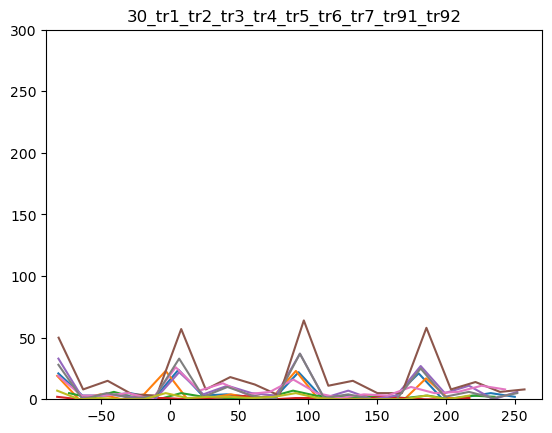

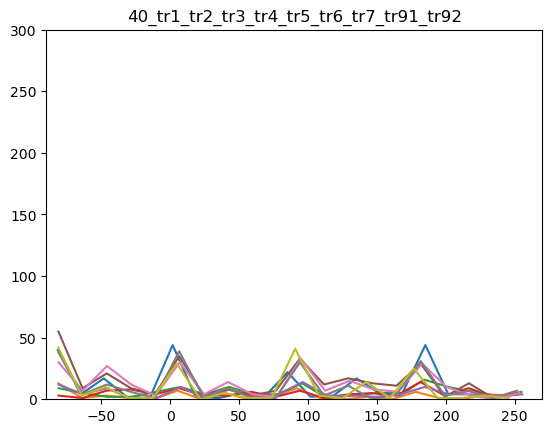

In [31]:
for i in [0, 1, 2, 3, 4, 10, 20, 30, 40]:
    plt.figure()
    ax = plt.gca()
    ax.set_xlim([-90, 270])
    ax.set_ylim([0, 300])
    tit = str(i)
    for na in names:
        plt.plot(all_hist[str(i)][na][0], all_hist[str(i)][na][1])
        tit = tit + '_' + na
    plt.title(tit)
    #plt.savefig('C:\\Users\\Lenovo\\1navigation\\angles_hist\\delta_ang\\'+tit)
    plt.show()

#нарисуем то же распледеление но пусть по y будет корень из прошлого y
for i in [10, 20, 30, 40]:
    plt.figure()
    tit = str(i) + '_sqrt'
    for na in names:
        all_hist[str(i)][na][1] = np.sqrt(all_hist[str(i)][na][1])
        plt.plot(all_hist[str(i)][na][0], all_hist[str(i)][na][1])
        tit = tit + '_' + na
    plt.title(tit)
    plt.show()

In [32]:
dfs_step

{'tr1':           time       x       y         Vx         Vy          V      angles  \
 0        1.068  -2.603  33.969   3.823529  -7.647059   8.549672  -63.434949   
 1        1.602   0.911  33.188  22.970588  -3.823529  23.286634   -9.450425   
 2        2.202   3.904  32.928   3.939394   0.000000   3.939394    0.000000   
 3        2.703   2.213  33.448  -3.823529   3.823529   5.407287  135.000000   
 4        3.203   1.171  32.668   7.878788 -19.696970  21.214286  -68.198591   
 ...        ...     ...     ...        ...        ...        ...         ...   
 3044  1751.817  43.860 -45.943   0.000000  -3.823529   3.823529  -90.000000   
 3045  1752.317  43.730 -45.943  -3.939394   0.000000   3.939394  180.000000   
 3046  1753.285  43.730 -45.943  -3.939394   0.000000   3.939394  180.000000   
 3047  1753.819  43.991 -45.943   3.852941   0.000000   3.852941    0.000000   
 3048  1754.319  43.860 -45.943  -3.969697   0.000000   3.969697  180.000000   
 
       delta_angle  near_wall  

for i in [10, 20, 30, 40]:
    print(i)
    tit = str(i) + '_sqrt'
    for na in names:
        print(all_hist[str(i)][na][0])
        

### возьмем от каждой мыши одинаковое количество точек. но от некотррых мышей выйдет чуть меньше точек, чем от большинства

In [33]:
for i in dfs_step:
    for n in [0, 1, 2, 3, 4, 10, 20, 30, 40]:
        print(i + ' ' + str(n))
        print(len(dfs_step[i].loc[dfs_step[i]['near_wall'] == n]))

tr1 0
516
tr1 1
389
tr1 2
247
tr1 3
543
tr1 4
281
tr1 10
106
tr1 20
610
tr1 30
127
tr1 40
230
tr2 0
358
tr2 1
391
tr2 2
519
tr2 3
371
tr2 4
112
tr2 10
459
tr2 20
552
tr2 30
107
tr2 40
58
tr3 0
281
tr3 1
267
tr3 2
237
tr3 3
85
tr3 4
223
tr3 10
87
tr3 20
35
tr3 30
49
tr3 40
120
tr4 0
149
tr4 1
105
tr4 2
83
tr4 3
30
tr4 4
52
tr4 10
72
tr4 20
108
tr4 30
16
tr4 40
99
tr5 0
379
tr5 1
185
tr5 2
202
tr5 3
227
tr5 4
228
tr5 10
90
tr5 20
228
tr5 30
182
tr5 40
102
tr6 0
576
tr6 1
274
tr6 2
288
tr6 3
164
tr6 4
641
tr6 10
272
tr6 20
155
tr6 30
372
tr6 40
290
tr7 0
558
tr7 1
690
tr7 2
228
tr7 3
165
tr7 4
209
tr7 10
484
tr7 20
267
tr7 30
155
tr7 40
249
tr91 0
370
tr91 1
316
tr91 2
375
tr91 3
273
tr91 4
968
tr91 10
217
tr91 20
218
tr91 30
165
tr91 40
210
tr92 0
281
tr92 1
102
tr92 2
34
tr92 3
43
tr92 4
2086
tr92 10
14
tr92 20
2
tr92 30
33
tr92 40
184


In [34]:
def makeDictCutDfsSteps(dictN, n1, l):
    for i in dfs_step:
        print(i + ' ' + str(n1))
        k = dfs_step[i].loc[dfs_step[i]['near_wall'] == n1]
        print(len(k))
        if len(k > l):
            k = k.iloc[0:l]
        print(len(k))
        dictN[i] = k

In [35]:
dict10 = {}
makeDictCutDfsSteps(dict10, 10, 90)
dict20 = {}
makeDictCutDfsSteps(dict20, 20, 108)
dict30 = {}
makeDictCutDfsSteps(dict30, 30, 107)
dict40 = {}
makeDictCutDfsSteps(dict40, 40, 102)

tr1 10
106
90
tr2 10
459
90
tr3 10
87
87
tr4 10
72
72
tr5 10
90
90
tr6 10
272
90
tr7 10
484
90
tr91 10
217
90
tr92 10
14
14
tr1 20
610
108
tr2 20
552
108
tr3 20
35
35
tr4 20
108
108
tr5 20
228
108
tr6 20
155
108
tr7 20
267
108
tr91 20
218
108
tr92 20
2
2
tr1 30
127
107
tr2 30
107
107
tr3 30
49
49
tr4 30
16
16
tr5 30
182
107
tr6 30
372
107
tr7 30
155
107
tr91 30
165
107
tr92 30
33
33
tr1 40
230
102
tr2 40
58
58
tr3 40
120
102
tr4 40
99
99
tr5 40
102
102
tr6 40
290
102
tr7 40
249
102
tr91 40
210
102
tr92 40
184
102


In [36]:
dict0 = {}
makeDictCutDfsSteps(dict0, 0, 281)
dict1 = {}
makeDictCutDfsSteps(dict1, 1, 200)
dict2 = {}
makeDictCutDfsSteps(dict2, 2, 202)
dict3 = {}
makeDictCutDfsSteps(dict3, 3, 164)
dict4 = {}
makeDictCutDfsSteps(dict4, 4, 209)

tr1 0
516
281
tr2 0
358
281
tr3 0
281
281
tr4 0
149
149
tr5 0
379
281
tr6 0
576
281
tr7 0
558
281
tr91 0
370
281
tr92 0
281
281
tr1 1
389
200
tr2 1
391
200
tr3 1
267
200
tr4 1
105
105
tr5 1
185
185
tr6 1
274
200
tr7 1
690
200
tr91 1
316
200
tr92 1
102
102
tr1 2
247
202
tr2 2
519
202
tr3 2
237
202
tr4 2
83
83
tr5 2
202
202
tr6 2
288
202
tr7 2
228
202
tr91 2
375
202
tr92 2
34
34
tr1 3
543
164
tr2 3
371
164
tr3 3
85
85
tr4 3
30
30
tr5 3
227
164
tr6 3
164
164
tr7 3
165
164
tr91 3
273
164
tr92 3
43
43
tr1 4
281
209
tr2 4
112
112
tr3 4
223
209
tr4 4
52
52
tr5 4
228
209
tr6 4
641
209
tr7 4
209
209
tr91 4
968
209
tr92 4
2086
209


In [37]:
dict10

{'tr1':           time       x       y         Vx         Vy          V      angles  \
 23      12.946  38.785  43.340  35.515152   0.000000  35.515152    0.000000   
 24      13.447  37.743  43.600   0.000000  -3.823529   3.823529  -90.000000   
 25      14.047  39.175  44.381  -7.878788   0.000000   7.878788  180.000000   
 26      14.548  37.223  44.251  -3.939394   0.000000   3.939394  180.000000   
 27      15.048  37.483  42.819   3.939394  -3.939394   5.571144  -45.000000   
 ...        ...     ...     ...        ...        ...        ...         ...   
 2793  1604.403  40.737  40.216   0.000000  11.470588  11.470588   90.000000   
 2794  1604.903  42.559  43.860  -3.939394   0.000000   3.939394  180.000000   
 2795  1605.404  42.949  44.121   0.000000   3.823529   3.823529   90.000000   
 2796  1605.904  43.730  44.771   3.939394   3.939394   5.571144   45.000000   
 2797  1606.405  43.079  44.251  -7.676471  -3.823529   8.575988  206.477174   
 
       delta_angle  near_wall  

In [53]:
def makeMergDf(dictN):
    listN = []
    for i in dictN:
        listN.append(dictN[i]['angles'])
    dfN = pd.concat(listN)
    dfN = dfN.reset_index()
    dfN = dfN.drop(['index'], axis=1)
    return dfN

In [54]:
df10 = makeMergDf(dict10)
df10

,angles
0,0.000000
1,-90.000000
2,180.000000
3,180.000000
4,-45.000000
...,...
708,30.957106
709,92.856206
710,-11.305588
711,48.806075


In [55]:
df20 = makeMergDf(dict20)
df30 = makeMergDf(dict30)
df40 = makeMergDf(dict40)
df0 = makeMergDf(dict0)
df1 = makeMergDf(dict1)
df2 = makeMergDf(dict2)
df3 = makeMergDf(dict3)
df4 = makeMergDf(dict4)

In [56]:
listAng = []
for i in dict10:
    listAng.append(dict10[i]['angles'])
for i in dict20:
    listAng.append(dict20[i]['angles'])
for i in dict30:
    listAng.append(dict30[i]['angles'])
for i in dict40:
    listAng.append(dict40[i]['angles'])
dfAng = pd.concat(listAng)
dfAng = dfAng.reset_index()
dfAng = dfAng.drop(['index'], axis=1)

In [57]:
listWall = []
for i in dict1:
    listWall.append(dict1[i]['angles'])
for i in dict2:
    listWall.append(dict2[i]['angles'])
for i in dict3:
    listWall.append(dict3[i]['angles'])
for i in dict4:
    listWall.append(dict4[i]['angles'])
dfWall = pd.concat(listWall)
dfWall = dfWall.reset_index()
dfWall = dfWall.drop(['index'], axis=1)

в общем теперь сделаны df по которым и надо построить гистограммы, согладить их и сохранить

In [58]:
mergDfs = {'10':df10, '20':df20, '30':df30, '40':df40, '0':df0, '1':df1, '2':df2, '3':df3, '4':df4, 'ang': dfAng, 'wall':dfWall}

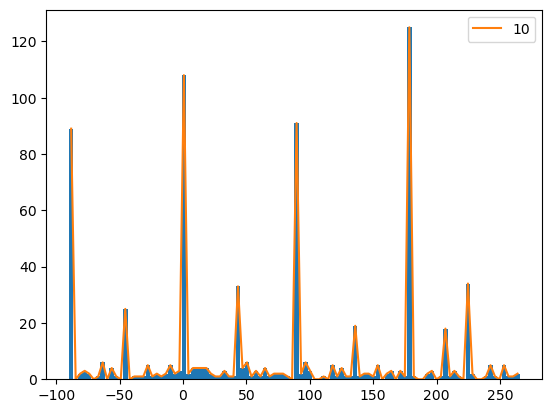

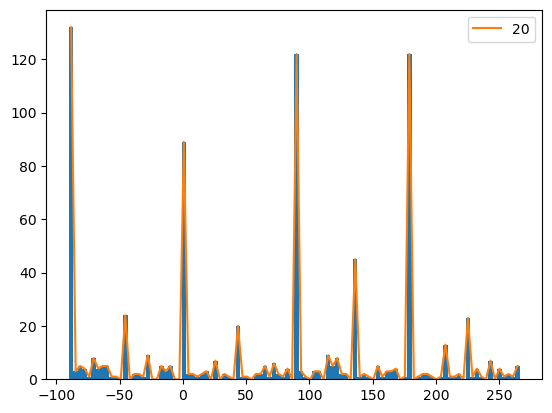

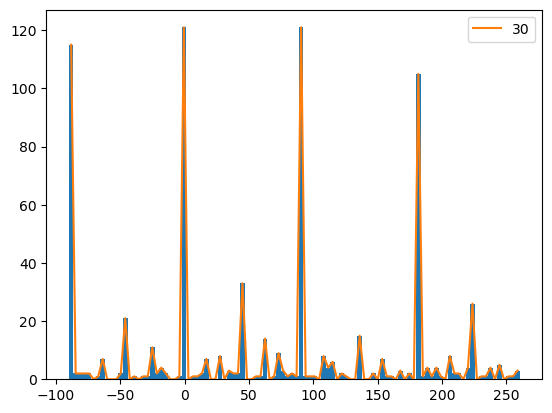

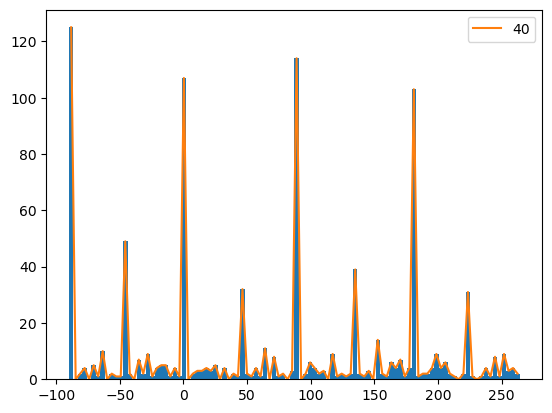

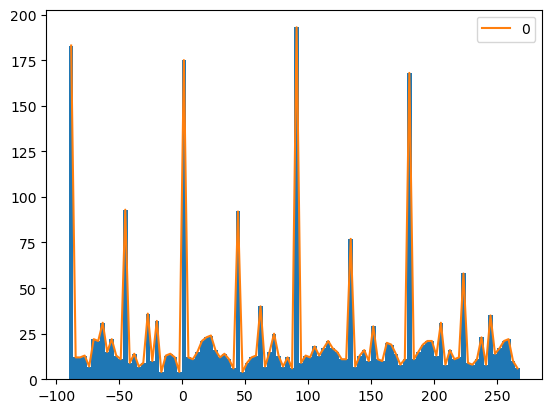

...

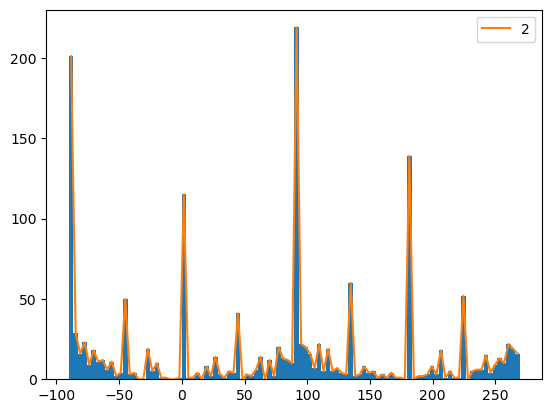

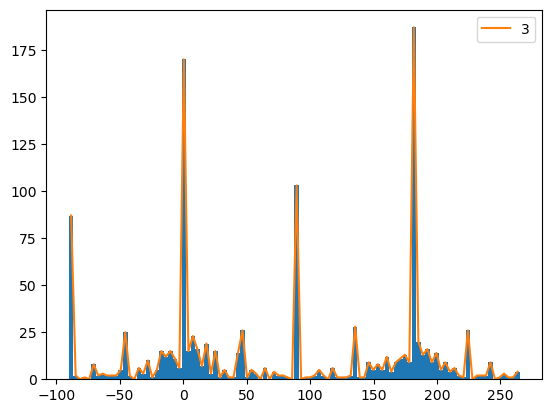

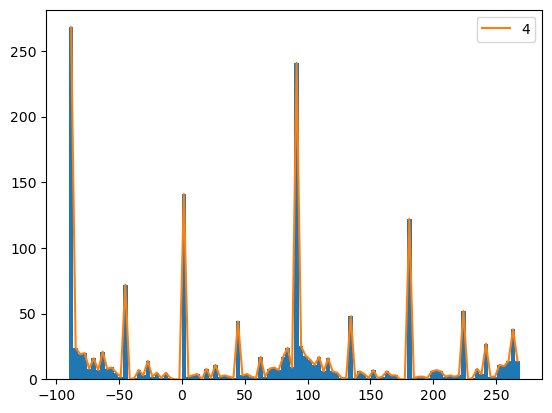

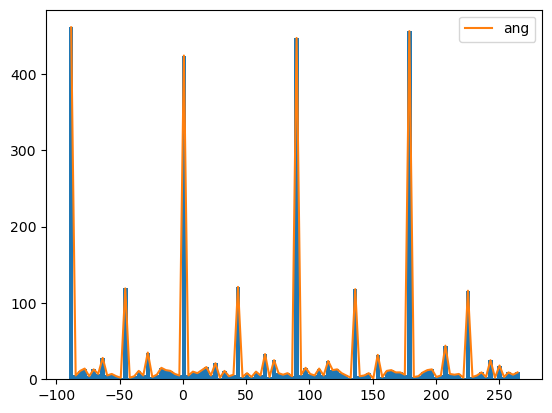

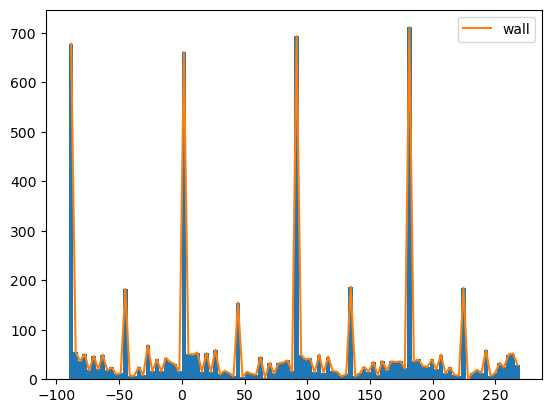

In [59]:
mergPlots = {}
for i in mergDfs:
    y, binEdges, _ = plt.hist(mergDfs[i], 100)
    x = 0.5 * (binEdges[1:] + binEdges[:-1])
    mergPlots[i]  = [x, y]
    plt.plot(x, y, label=i)
    plt.legend()
    plt.show()

In [45]:
%matplotlib inline

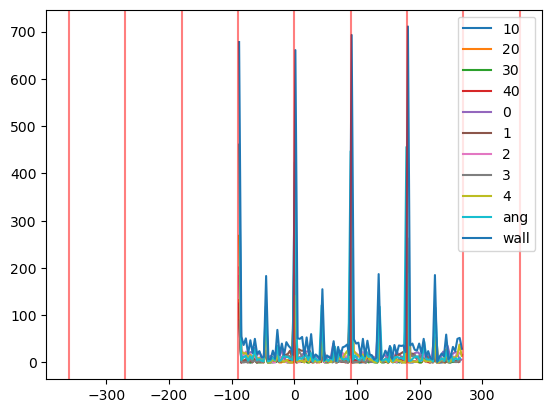

In [60]:
for i in mergPlots:
    x = mergPlots[i][0]
    y = mergPlots[i][1]
    plt.plot(x, y, label=i)
plt.legend()
plt.axvline(x=0, c='red', alpha=0.5)
plt.axvline(x=90, c='red', alpha=0.5)
plt.axvline(x=180, c='red', alpha=0.5)
plt.axvline(x=270, c='red', alpha=0.5)
plt.axvline(x=360, c='red', alpha=0.5)
plt.axvline(x=-90, c='red', alpha=0.5)
plt.axvline(x=-180, c='red', alpha=0.5)
plt.axvline(x=-270, c='red', alpha=0.5)
plt.axvline(x=-360, c='red', alpha=0.5)

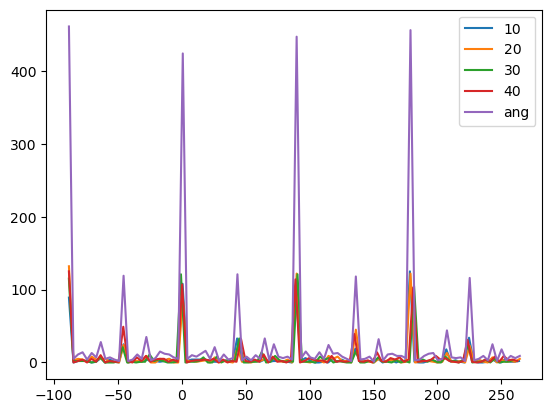

In [61]:
for i in ['10', '20', '30', '40', 'ang']:
    x = mergPlots[i][0]
    y = mergPlots[i][1]
    plt.plot(x, y, label=i)
plt.legend()

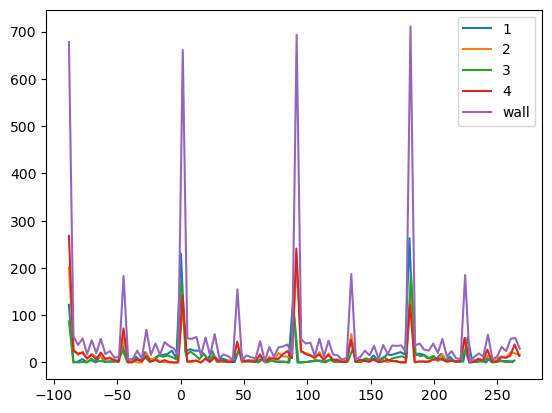

In [62]:
for i in ['1', '2', '3', '4', 'wall']:
    x = mergPlots[i][0]
    y = mergPlots[i][1]
    plt.plot(x, y, label=i)
plt.legend()

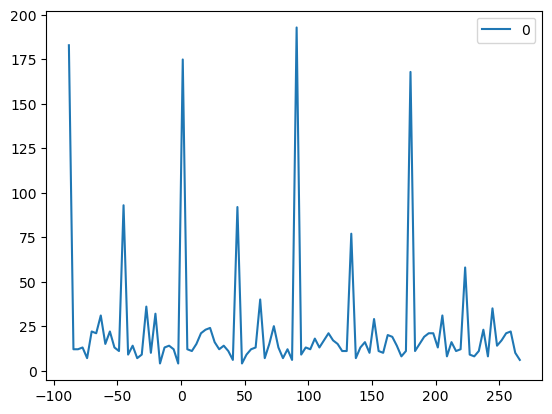

In [63]:
for i in ['0']:
    x = mergPlots[i][0]
    y = mergPlots[i][1]
    plt.plot(x, y, label=i)
plt.legend()

##### надо нормализовать от 0 до 1 все эти графики

In [64]:
def minMaxOfY(y):
    yn = (y - y.min()) / (y.max() - y.min())
    return yn

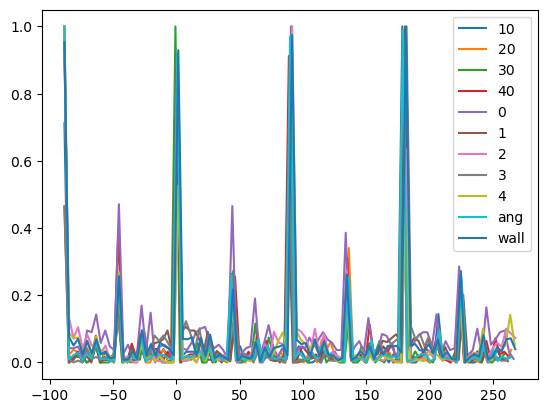

In [65]:
for i in mergPlots:
    mergPlots[i][1] = minMaxOfY(mergPlots[i][1])
    plt.plot(mergPlots[i][0], mergPlots[i][1], label=i)
plt.legend()

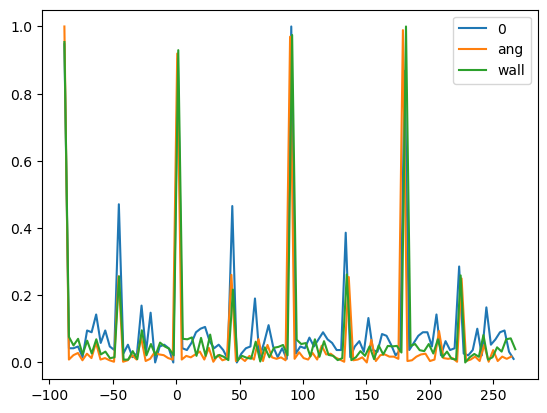

In [66]:
for i in ['0', 'ang', 'wall']:
    plt.plot(mergPlots[i][0], mergPlots[i][1], label=i)
plt.legend()
    

## нарисуем круговые даграммы

In [69]:
for r in mergPlots[i][0]:
    print(r)

-88.20291680040938
-84.60875040122815
-81.01458400204692
-77.4204176028657
-73.82625120368446
-70.23208480450324
-66.63791840532201
-63.04375200614078
-59.449585606959545
-55.85541920777831
-52.26125280859709
-48.66708640941586
-45.072920010234625
-41.47875361105339
-37.88458721187217
-34.29042081269094
-30.696254413509706
-27.102088014328473
-23.507921615147247
-19.91375521596602
-16.319588816784787
-12.72542241760356
-9.131256018422334
-5.537089619241101
-1.9429232200598676
1.6512431791213658
5.245409578302592
8.839575977483818
12.433742376665052
16.027908775846278
19.622075175027504
23.216241574208738
26.81040797338997
30.404574372571204
33.99874077175243
37.592907170933664
41.18707357011489
44.78123996929611
48.37540636847734
51.969572767658576
55.56373916683981
59.15790556602104
62.752071965202276
66.3462383643835
69.94040476356471
73.53457116274595
77.12873756192718
80.72290396110841
84.31707036028965
87.91123675947088
91.50540315865211
95.09956955783335
98.69373595701457
102.287

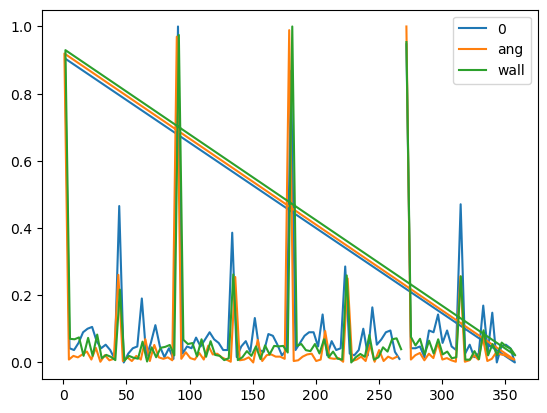

In [71]:
for i in ['0', 'ang', 'wall']:
    for j in range(len(mergPlots[i][0])):
        if mergPlots[i][0][j] < 0:
            mergPlots[i][0][j] += 360
    plt.plot(mergPlots[i][0], mergPlots[i][1], label=i)
plt.legend()

In [ ]:
N = 100

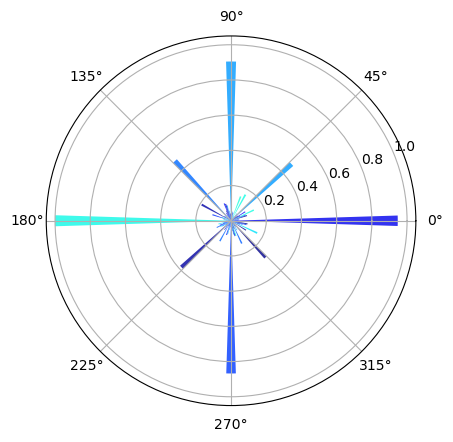

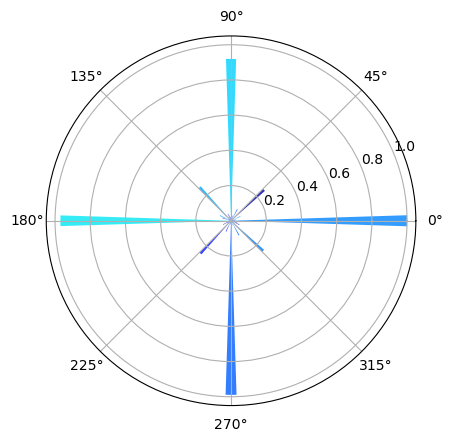

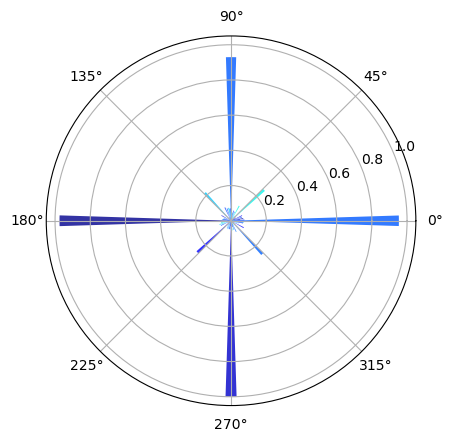

In [81]:
%matplotlib inline
for i in ['0', 'ang', 'wall']:
    N = 100
    bottom = 0
    max_height = 20

    theta = np.linspace(0.0, 2 * np.pi, N, endpoint=False)
    #radii = max_height*np.random.rand(N)
    width = (2*np.pi) / N

    ax = plt.subplot(111, polar=True)
    bars = ax.bar(theta, mergPlots[i][1], width=width, bottom=bottom)

    # Use custom colors and opacity
    radii = max_height*np.random.rand(N)
    for r, bar in zip(radii, bars):
        bar.set_facecolor(plt.cm.jet(r / 51))
        # bar.set_facecolor(plt.cm.jet(r / 10.))
        bar.set_alpha(0.8)

    plt.show()

In [83]:
%matplotlib
for i in ['0', 'ang', 'wall']:
    plt.figure()
    N = 100
    bottom = 0
    max_height = 20

    theta = np.linspace(0.0, 2 * np.pi, N, endpoint=False)
    #radii = max_height*np.random.rand(N)
    width = (2*np.pi) / N

    ax = plt.subplot(111, polar=True)
    bars = ax.bar(theta, mergPlots[i][1], width=width, bottom=bottom)

    # Use custom colors and opacity
    radii = max_height*np.random.rand(N)
    for r, bar in zip(radii, bars):
        bar.set_facecolor(plt.cm.jet(r / 51))
        # bar.set_facecolor(plt.cm.jet(r / 10.))
        bar.set_alpha(0.8)

    plt.show()

Using matplotlib backend: Qt5Agg


##### можно сохранить уже эти распредения в словарь

mergPlots['0']

origDistr = {}
for i in ['0', 'ang', 'wall']:
    origDistr[i] = mergPlots[i]

origDistr

import pickle
with open('angOrigDistr.pkl', 'wb') as fp:
    pickle.dump(origDistr, fp)

In [84]:
print('hello')

hello


for i in ['1','2','3','4','ang']:
    plt.plot(mergPlots[i][0], mergPlots[i][1], label=i)
plt.legend()

mi = y.min()
ma = y.max()
print(mi, ma)
yn = (y - y.min()) / (y.max() - y.min())
plt. plot(x, yn)

mergPlots['0']

#### первый вариант - по гаусу

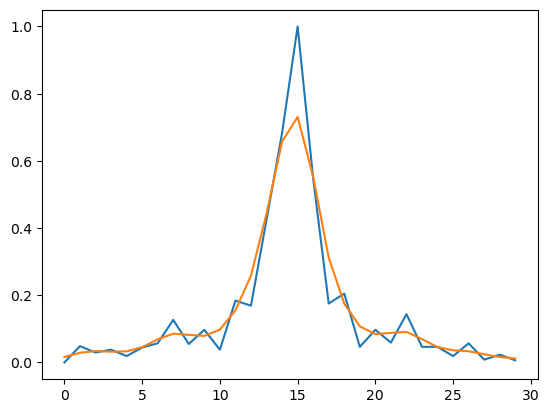

In [129]:
x = mergPlots['0'][1]
y3 = gaussian_filter1d(x, 1)
plt.plot(x)
plt.plot(y3)

### второй варик с кернел денсити

from scipy.stats import norm
from sklearn.neighbors import KernelDensity

#X = mergPlots['0'][1]
X = mergDfs['0'].to_numpy()
x = mergDfs['0'].to_numpy()
X

C:\Users\Lenovo\AppData\Local\Temp\ipykernel_13220\3996776045.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  k = sns.distplot(mergDfs[i]['delta_angle'], hist=True, kde=True, bins=int(180/5), color = 'magenta',  hist_kws={'edgecolor':'black'}, kde_kws={'linewidth': 1})


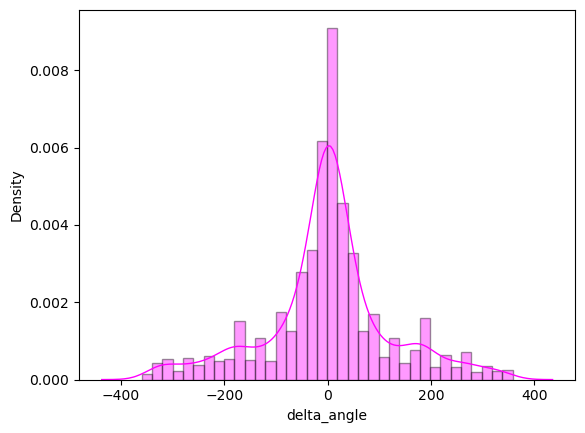

C:\Users\Lenovo\AppData\Local\Temp\ipykernel_13220\3996776045.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  k = sns.distplot(mergDfs[i]['delta_angle'], hist=True, kde=True, bins=int(180/5), color = 'magenta',  hist_kws={'edgecolor':'black'}, kde_kws={'linewidth': 1})


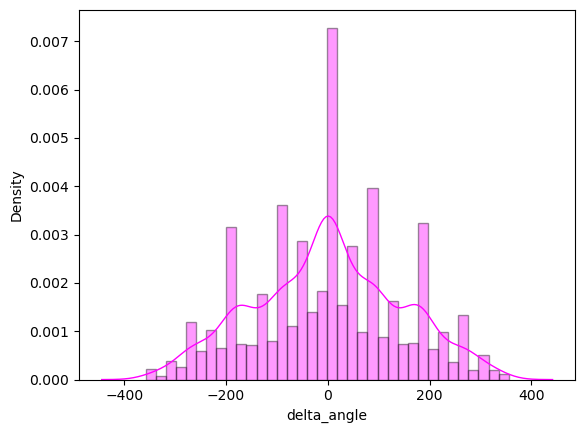

C:\Users\Lenovo\AppData\Local\Temp\ipykernel_13220\3996776045.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  k = sns.distplot(mergDfs[i]['delta_angle'], hist=True, kde=True, bins=int(180/5), color = 'magenta',  hist_kws={'edgecolor':'black'}, kde_kws={'linewidth': 1})


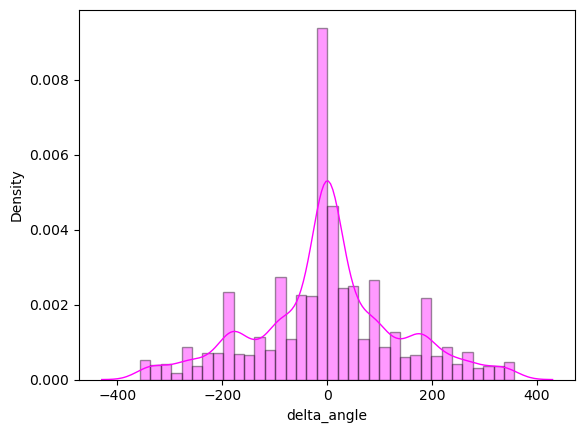

In [209]:
finalDistr = {}
for i in ['0', 'ang', 'wall']:
    k = sns.distplot(mergDfs[i]['delta_angle'], hist=True, kde=True, bins=int(180/5), color = 'magenta',  hist_kws={'edgecolor':'black'}, kde_kws={'linewidth': 1})
    plt.show()
    j = k.lines
    x = j[0]._xorig
    y = j[0]._yorig
    y = minMaxOfY(y)
    finalDistr[i] = [x, y]
    

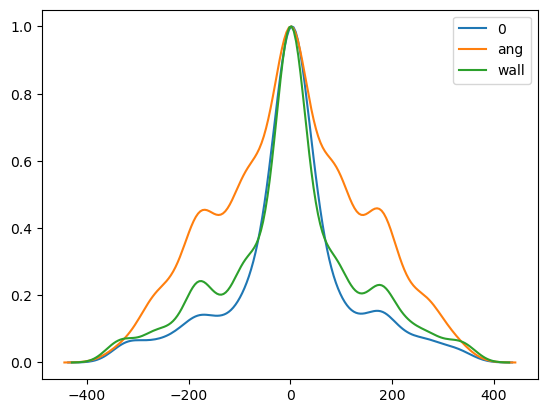

In [211]:
for i in finalDistr:
    plt.plot(finalDistr[i][0], finalDistr[i][1], label = i)
plt.legend()

In [213]:
import pickle
with open('angleDistr.pkl', 'wb') as fp:
    pickle.dump(finalDistr, fp)

# draft

C:\Users\Lenovo\AppData\Local\Temp\ipykernel_13220\3933175559.py:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  k = sns.distplot(mergDfs['0']['delta_angle'], hist=True, kde=True, bins=int(180/5), color = 'darkblue',  hist_kws={'edgecolor':'black'}, kde_kws={'linewidth': 1})


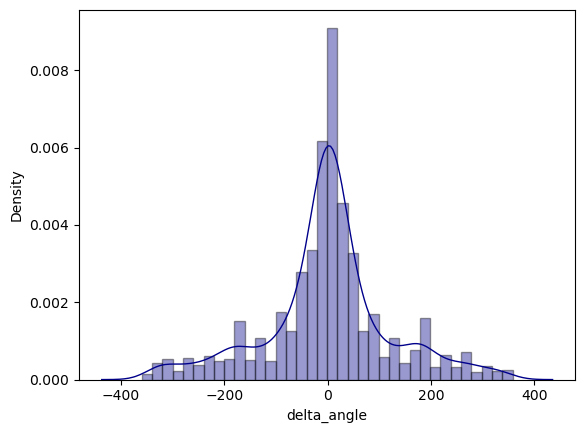

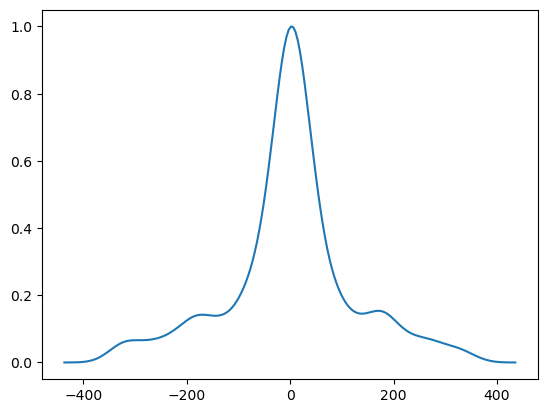

In [210]:
k = sns.distplot(mergDfs['0']['delta_angle'], hist=True, kde=True, bins=int(180/5), color = 'darkblue',  hist_kws={'edgecolor':'black'}, kde_kws={'linewidth': 1})
plt.show()
j = k.lines
x = j[0]._xorig
y = j[0]._yorig
y = minMaxOfY(y)
plt.figure()
plt.plot(x,y) 
plt.show()

#Plot pandas histogram from dataframe with df.plot.hist (not df.hist)
ax = mergDfs['10']['delta_angle'].plot.hist(bins=30, density=True, edgecolor='w', linewidth=0.5)

#Save default x-axis limits for final formatting because the pandas kde
#plot uses much wider limits which usually decreases readability
xlim = ax.get_xlim()

#Plot pandas KDE
mergDfs['10']['delta_angle'].plot.density(color='k', alpha=0.5, ax=ax) # same as df['var'].plot.kde()

#Reset x-axis limits and edit legend and add title
ax.set_xlim(xlim)
ax.legend(labels=['KDE'], frameon=False)
ax.set_title('Pandas histogram overlaid with KDE', fontsize=14, pad=15)

plt.show()

C:\Users\Lenovo\AppData\Local\Temp\ipykernel_13220\2252386107.py:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  k = sns.distplot(mergDfs['0']['delta_angle'], hist=True, kde=True, bins=int(180/5), color = 'darkblue',  hist_kws={'edgecolor':'black'}, kde_kws={'linewidth': 1})


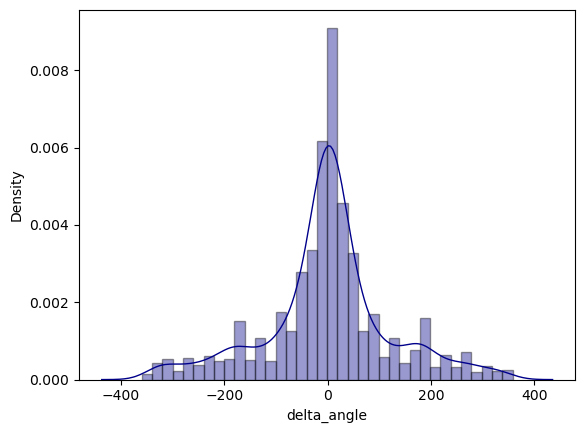

In [184]:
k = sns.distplot(mergDfs['0']['delta_angle'], hist=True, kde=True, bins=int(180/5), color = 'darkblue',  hist_kws={'edgecolor':'black'}, kde_kws={'linewidth': 1})

In [189]:
k.xaxis.get_data_interval
j = k.lines
type(j)

list

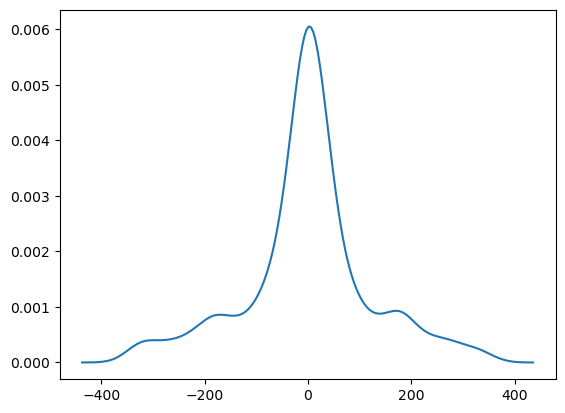

In [198]:
plt.plot(j[0]._xorig,j[0]._yorig) 

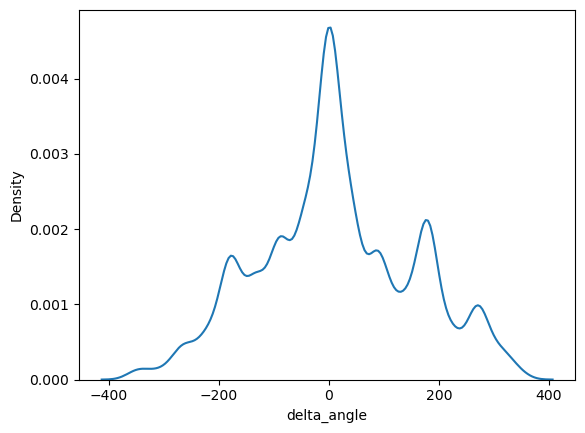

In [71]:
k = sns.kdeplot(data=mergDfs['20']['delta_angle'], bw_adjust=0.5)

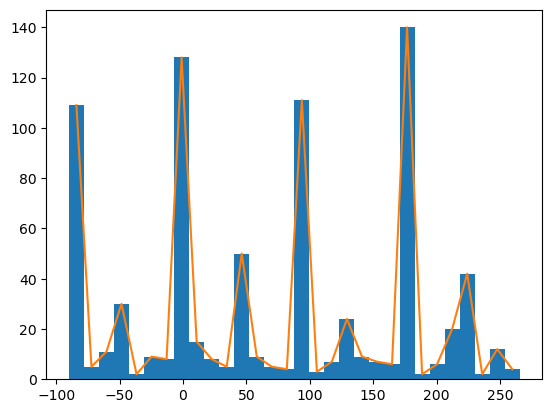

In [74]:
y10, binEdges, _ = plt.hist(df10, 30)
x10 = 0.5 * (binEdges[1:] + binEdges[:-1])
plot10 = [x10, y10]
plt.plot(x10, y10)

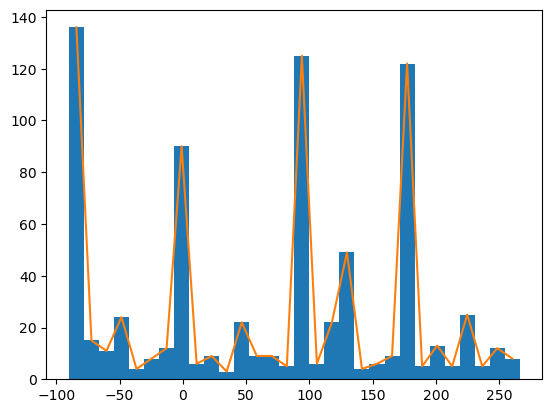

In [75]:
y20, binEdges, _ = plt.hist(df20, 30)
x20 = 0.5 * (binEdges[1:] + binEdges[:-1])
plot20 = [x20, y20]
plt.plot(x20, y20)

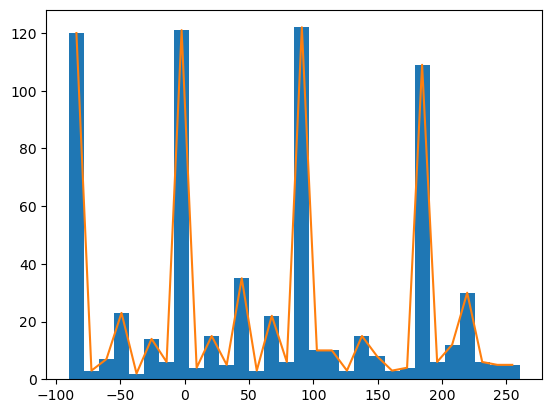

In [76]:
y30, binEdges, _ = plt.hist(df30, 30)
x30 = 0.5 * (binEdges[1:] + binEdges[:-1])
plot30 = [x30, y30]
plt.plot(x30, y30)

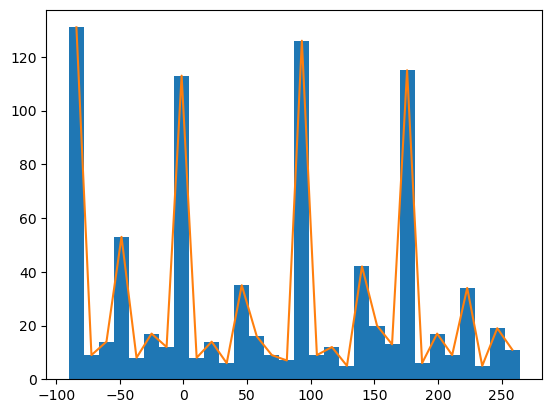

In [77]:
y40, binEdges, _ = plt.hist(df40, 30)
x40 = 0.5 * (binEdges[1:] + binEdges[:-1])
plot40 = [x40, y40]
plt.plot(x40, y40)

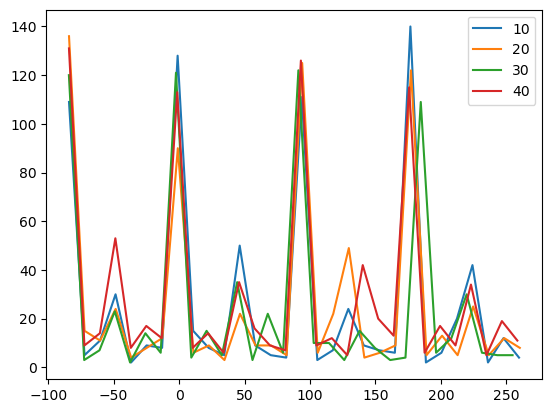

In [80]:
plt.plot(x10, y10, label='10')
plt.plot(x20, y20, label='20')
plt.plot(x30, y30, label='30')
plt.plot(x40, y40, label='40')

plt.legend()
plt.show()


In [ ]:
averHists = {}
for na in names:
    dffor1line = dfs_step[na].loc[dfs_step[na]['near_wall'] == numb]
    y, binEdges, _ = plt.hist(dffor1line['angles'], 20)
    x = 0.5 * (binEdges[1:] + binEdges[:-1])
    all_hist[str(numb)][na] = [x, y]